# Google Notebook specific Stuff

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [2]:
!pip install matplotlib==3.3.2
!pip install pytorch-lightning==1.2.4
!pip install smashpy
!pip install scGeneFit
!pip install scanpy
!pip install anndata
!git clone https://github.com/ahsv/RankCorr.git

fatal: destination path 'RankCorr' already exists and is not an empty directory.


In [3]:
# Check GPU

gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Wed May 12 23:29:29 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 465.19.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P0    23W / 300W |      0MiB / 16160MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [4]:
import sys
import os
# to import utils
sys.path.append(os.path.abspath('/content/gdrive/My Drive/Differentiable-Sparse-Subset-Selection/notebooks'))

# All the Imports

In [5]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sklearn.preprocessing import LabelEncoder

from RankCorr.picturedRocks import Rocks
import smashpy



import torch
from torch import nn
from torch.autograd import Variable
from torch.nn import functional as F

from utils import *


In [6]:
cuda = True if torch.cuda.is_available() else False

device = torch.device("cuda:0" if cuda else "cpu")
#device = 'cpu'
print("Device")
print(device)

Device
cuda:0


# These should be parameters later on 

In [7]:
z_size = 15
hidden_layer_size = 500

# really good results for vanilla VAE on synthetic data with EPOCHS set to 50, 
# but when running locally set to 10 for reasonable run times
n_epochs = 600
batch_size = 64


global_t = 3.0

k = 50

num_times = 5

# Here goes all the stuff that we change from dataset to dataset

In [8]:
from os import path

In [9]:
dataset_dir = '/content/gdrive/MyDrive/Differentiable-Sparse-Subset-Selection/data/mouse_brain_broad/'
model_save_path = '/content/gdrive/MyDrive/Differentiable-Sparse-Subset-Selection/data/mouse_brain_broad/models/'
viz_save_path = '/content/gdrive/MyDrive/Differentiable-Sparse-Subset-Selection/data/mouse_brain_broad/visualizations/'

if not path.exists(model_save_path):
  os.mkdir(model_save_path)

if not path.exists(model_save_path + 'experiment_data_folds/'):
  os.mkdir(model_save_path + 'experiment_data_folds/')
  
if not path.exists(viz_save_path):
  os.mkdir(viz_save_path)

  

# Dataset Specific Processing

`

In [10]:
preprocess_like_smash = False
preprocess_like_cell_location=True

In [11]:
import anndata

In [12]:
def relabel_mouse_labels(label):
    if isinstance(label, str):
        return label.split('_')[0]
    else:
        return label

In [13]:
adata_snrna_raw = anndata.read_h5ad(dataset_dir + "mouse_brain_all_cells_20200625.h5ad")
del adata_snrna_raw.raw
adata_snrna_raw = adata_snrna_raw
adata_snrna_raw.X = adata_snrna_raw.X.toarray()
## Cell type annotations
labels = pd.read_csv(dataset_dir + 'snRNA_annotation_astro_subtypes_refined59_20200823.csv', index_col=0)
labels['annotation'] = labels['annotation_1'].apply(lambda x: relabel_mouse_labels(x))
labels = labels[['annotation']]
labels = labels.reindex(index=adata_snrna_raw.obs_names)
adata_snrna_raw.obs[labels.columns] = labels
adata_snrna_raw = adata_snrna_raw[~adata_snrna_raw.obs['annotation'].isna(), :]
adata_snrna_raw = adata_snrna_raw[adata_snrna_raw.obs["annotation"]!='Unk']
adata_snrna_raw.obs['annotation'] = adata_snrna_raw.obs['annotation'].astype('category')

Trying to set attribute `.obs` of view, copying.


In [14]:
adata_snrna_raw.X

array([[14.,  2.,  0., ...,  0.,  0.,  0.],
       [ 1.,  0.,  0., ...,  0.,  0.,  0.],
       [ 1.,  0.,  0., ...,  0.,  0.,  0.],
       ...,
       [ 3.,  0.,  0., ...,  0.,  0.,  0.],
       [ 1.,  0.,  0., ...,  0.,  0.,  0.],
       [ 5.,  2.,  0., ...,  0.,  0.,  0.]], dtype=float32)

In [15]:
labels['annotation'].unique()

array(['Ext', 'Oligo', 'Astro', 'Inh', 'Micro', 'Nb', 'Unk', 'OPC',
       'LowQ', nan, 'Endo'], dtype=object)

In [16]:
adata_snrna_raw.layers

Layers with keys: 

In [17]:
print(adata_snrna_raw.shape)

(39583, 31053)


In [18]:
def remove_features_pct(adata, group_by=None, pct=0.3):
		if group_by is None:
			print("select a group_by in .obs")
			return
		if group_by not in adata.obs.columns:
			print("group_by must be in .obs")
			return 
		
		
		list_keep_genes = []
		
		df = pd.DataFrame(data=False, 
						  index=adata.var.index.tolist(),
						  columns=adata.obs[group_by].cat.categories)
		for g in adata.obs[group_by].cat.categories: 
			reduced = adata[adata.obs[group_by]==g]
			boolean, values = sc.pp.filter_genes(reduced, min_cells = reduced.n_obs*pct, inplace=False)
			df[g] = boolean
		dfT = df.T
		for g in dfT.columns:
			if True in dfT[g].tolist():
				list_keep_genes.append(True)
			else:
				list_keep_genes.append(False)
		
		adata.var["general"] = list_keep_genes
		
		adata = adata[:, adata.var["general"]]
		
		return adata

def remove_features_pct_2groups(adata, group_by=None, pct1=0.9, pct2=0.5):
    if group_by is None:
        print("select a group_by in .obs")
        return
    if group_by not in adata.obs.columns:
        print("group_by must be in .obs")
        return 
    
    
    list_keep_genes = []
    
    df = pd.DataFrame(data=False, 
                        index=adata.var.index.tolist(),
                        columns=adata.obs[group_by].cat.categories)
    for g in adata.obs[group_by].cat.categories: 
        reduced = adata[adata.obs[group_by]==g]
        boolean, values = sc.pp.filter_genes(reduced, min_cells = reduced.n_obs*(pct1), inplace=False)
        df[g] = boolean
    dfT = df.T
    for g in dfT.columns:
        if (sum(dfT[g].tolist())/len(dfT[g].tolist())) >= pct2:
            list_keep_genes.append(False)
        else:
            list_keep_genes.append(True)
    
    adata.var["general"] = list_keep_genes
    
    adata = adata[:, adata.var["general"]]
    
    
    return adata


In [19]:
import gc

In [20]:
%%time

# doing this cuz smash was a lot of data
#https://cell2location.readthedocs.io/en/latest/notebooks/cell2location_estimating_signatures.html
if preprocess_like_cell_location:
    sc.pp.filter_cells(adata_snrna_raw, min_genes=1)
    print(adata_snrna_raw.shape)
    sc.pp.filter_genes(adata_snrna_raw, min_cells=1)
    print(adata_snrna_raw.shape)

    gc.collect()
    # calculate the mean of each gene across non-zero cells
    adata_snrna_raw.var['n_cells'] = (adata_snrna_raw.X > 0).sum(0)
    adata_snrna_raw.var['nonz_mean'] = adata_snrna_raw.X.sum(0) / adata_snrna_raw.var['n_cells']

    nonz_mean_cutoff = np.log10(1.12) # cut off for expression in non-zero cells
    cell_count_cutoff = np.log10(adata_snrna_raw.shape[0] * 0.0005) # cut off percentage for cells with higher expression
    cell_count_cutoff2 = np.log10(adata_snrna_raw.shape[0] * 0.03)# cut off percentage for cells with small expression


    adata_snrna_raw[:,(np.array(np.log10(adata_snrna_raw.var['nonz_mean']) > nonz_mean_cutoff)
            | np.array(np.log10(adata_snrna_raw.var['n_cells']) > cell_count_cutoff2))
        & np.array(np.log10(adata_snrna_raw.var['n_cells']) > cell_count_cutoff)].shape

    # select genes based on mean expression in non-zero cells
    adata_snrna_raw = adata_snrna_raw[:,(np.array(np.log10(adata_snrna_raw.var['nonz_mean']) > nonz_mean_cutoff)
            | np.array(np.log10(adata_snrna_raw.var['n_cells']) > cell_count_cutoff2))
        & np.array(np.log10(adata_snrna_raw.var['n_cells']) > cell_count_cutoff)
                & np.array(~adata_snrna_raw.var['SYMBOL'].isna())]
    gc.collect()
    adata_snrna_raw.raw = adata_snrna_raw
    adata_snrna_raw.X = adata_snrna_raw.raw.X.copy()
    del adata_snrna_raw.raw
    gc.collect()
    adata_snrna_raw = remove_features_pct(adata_snrna_raw, group_by="annotation", pct=0.3)
    gc.collect()
    adata_snrna_raw = remove_features_pct_2groups(adata_snrna_raw, group_by="annotation", pct1=0.75, pct2=0.5)
    print(adata_snrna_raw.shape)
    
    sc.pp.normalize_per_cell(adata_snrna_raw, counts_per_cell_after=1e4)
    sc.pp.log1p(adata_snrna_raw)
    sc.pp.scale(adata_snrna_raw, max_value=10)


(39583, 31053)
(39583, 26493)


Trying to set attribute `.var` of view, copying.


(39583, 4581)


Trying to set attribute `.obs` of view, copying.


CPU times: user 41.5 s, sys: 5.07 s, total: 46.6 s
Wall time: 46.3 s


In [21]:
adata_snrna_raw.shape

(39583, 4581)

In [22]:
X = adata_snrna_raw.X.copy()
labels = adata_snrna_raw.obs['annotation'].values
encoder = LabelEncoder()
encoder.fit(labels)
y = encoder.transform(labels)

In [23]:
input_size = X.shape[1]

In [24]:
X.shape

(39583, 4581)

# Set Up Models

In [28]:
def visualize_confusion_matrix(cm, encoder):
    sns.set(font_scale=1.4)
    sns.set_style("white")
    
    sns.despine(offset=10, trim=False)
    
    f, axs = plt.subplots(1,1,figsize=(8,8))
    if labels != None:
        df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred), index=labels, columns=labels)
    else:        
        df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred))
    sns.heatmap(df_cm, annot=True, annot_kws={"size": 12}, fmt='d', cbar=False, cmap=mymap, ax=axs)
    axs.set(xlabel='Predicted labels', ylabel='True labels')
    axs.set_title("Confusion matrix")

    
    f, axs = plt.subplots(1,1,figsize=(9.5,8))
    if labels != None:
        df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred, normalize="true"), index=labels, columns=labels)*100
    else:
        df_cm = pd.DataFrame(confusion_matrix(y_test, y_pred, normalize="true"))*100
    sns.heatmap(df_cm, annot=True, annot_kws={"size": 10}, fmt='.2f', cbar=True, cmap=mymap, ax=axs, cbar_kws={'label': 'Classification rate (%)'})
    axs.set(xlabel='Predicted labels', ylabel='True labels')
    axs.set_title(title)
    axs.set_xticklabels(axs.get_xticklabels(), rotation=45) 
    plt.show(block=False)
    if save:
        plt.tight_layout()
        f.savefig('Figures/%s_ConfMat.pdf'%title, bbox_inches='tight')
    plt.close("all")


## Train Smash

the data is treated a bit differently than our other models

 * Initialising ...

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 32)                146624    
_________________________________________________________________
batch_normalization (BatchNo (None, 32)                128       
_________________________________________________________________
activation (Activation)      (None, 32)                0         
_________________________________________________________________
dropout (Dropout)            (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 16)                528       
_________________________________________________________________
batch_normalization_1 (Batch (None, 16)                64        
_________________________________________________________________
activation_1 (Activation)    (None,

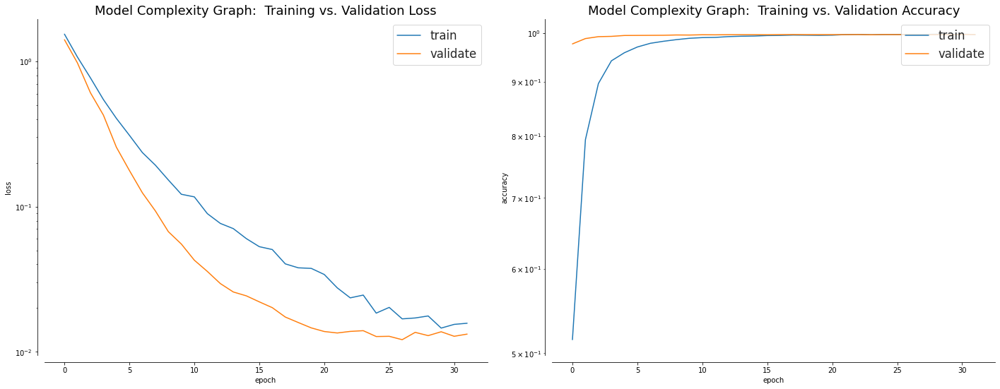

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning:

`model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).



<Figure size 432x288 with 0 Axes>

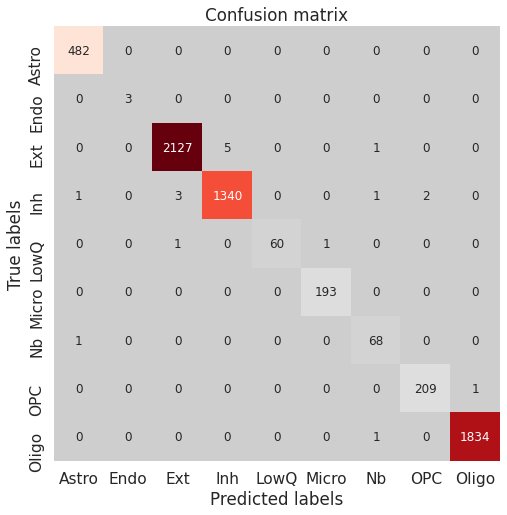

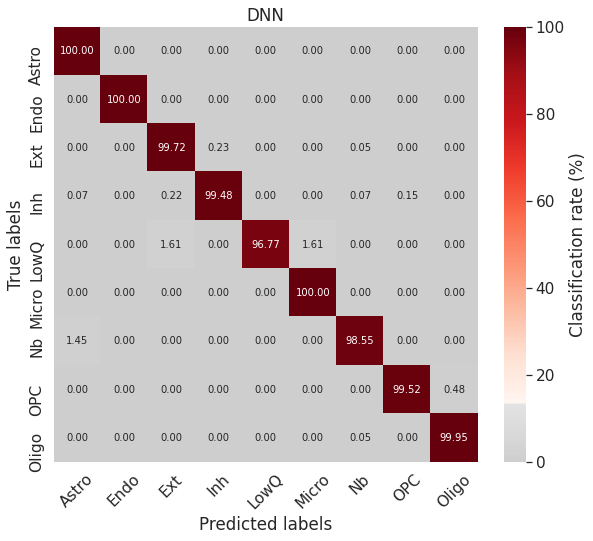

              precision    recall  f1-score   support

       Astro       1.00      1.00      1.00       482
        Endo       1.00      1.00      1.00         3
         Ext       1.00      1.00      1.00      2133
         Inh       1.00      0.99      1.00      1347
        LowQ       1.00      0.97      0.98        62
       Micro       0.99      1.00      1.00       193
          Nb       0.96      0.99      0.97        69
         OPC       0.99      1.00      0.99       210
       Oligo       1.00      1.00      1.00      1835

    accuracy                           1.00      6334
   macro avg       0.99      0.99      0.99      6334
weighted avg       1.00      1.00      1.00      6334

198/198 [==============================] - 1s 4ms/step - loss: 0.0121 - accuracy: 0.9972 - auc: 0.9997 - precision: 0.9975 - recall: 0.9972


/usr/local/lib/python3.7/dist-packages/shap/explainers/_deep/deep_tf.py:91: UserWarning:

keras is no longer supported, please use tf.keras instead.

/usr/local/lib/python3.7/dist-packages/shap/explainers/_deep/deep_tf.py:96: UserWarning:

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode. See PR #1483 for discussion.

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:434: UserWarning:

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.



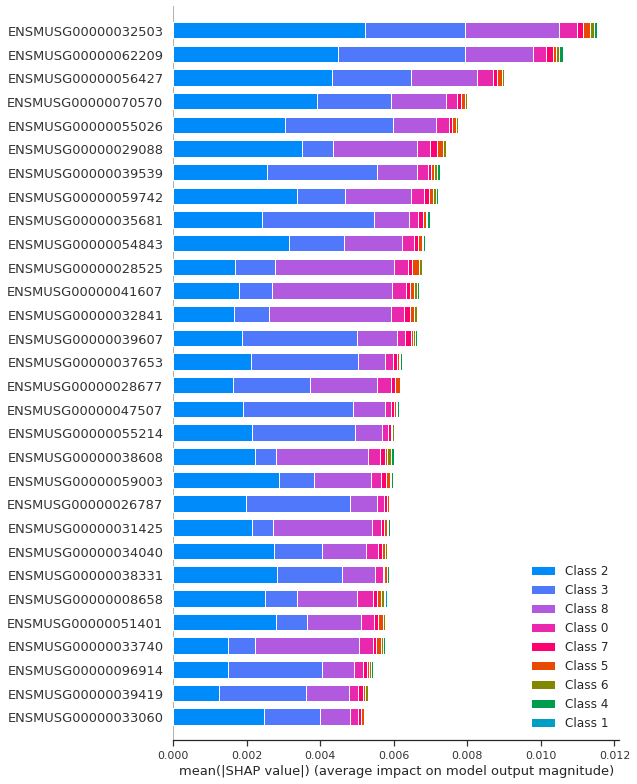

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or

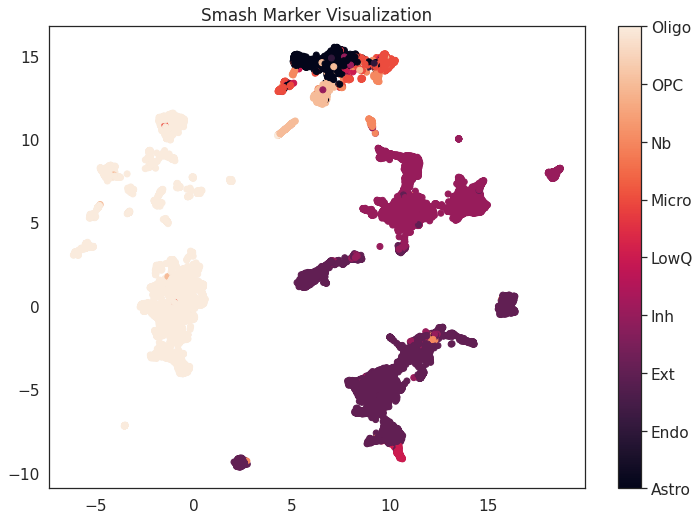

 * Initialising ...
Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 32)                146624    
_________________________________________________________________
batch_normalization_4 (Batch (None, 32)                128       
_________________________________________________________________
activation_4 (Activation)    (None, 32)                0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_7 (Dense)              (None, 16)                528       
_________________________________________________________________
batch_normalization_5 (Batch (None, 16)                64        
_________________________________________________________________
activation_5 (Activation)    (None

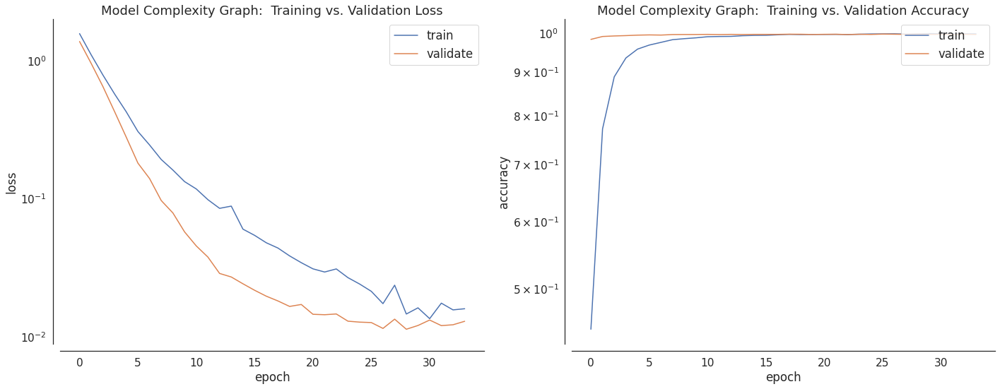

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning:

`model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).



<Figure size 432x288 with 0 Axes>

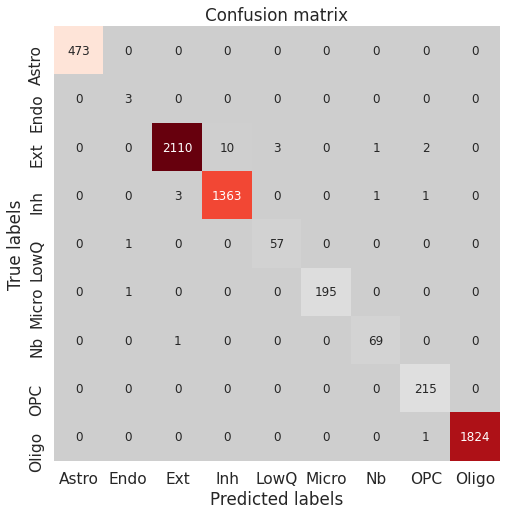

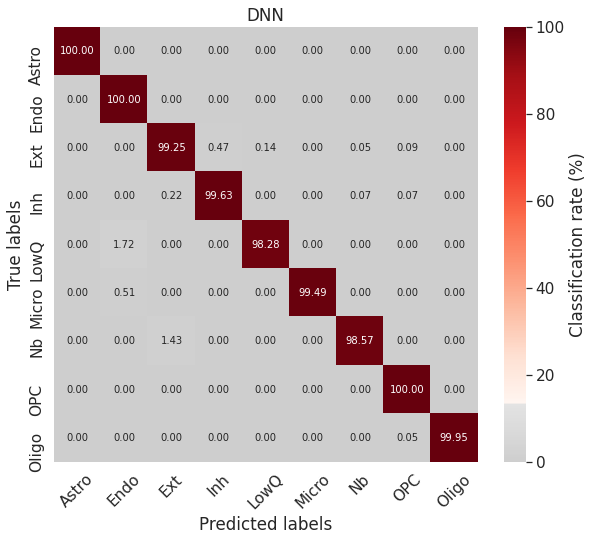

              precision    recall  f1-score   support

       Astro       1.00      1.00      1.00       473
        Endo       0.60      1.00      0.75         3
         Ext       1.00      0.99      1.00      2126
         Inh       0.99      1.00      0.99      1368
        LowQ       0.95      0.98      0.97        58
       Micro       1.00      0.99      1.00       196
          Nb       0.97      0.99      0.98        70
         OPC       0.98      1.00      0.99       215
       Oligo       1.00      1.00      1.00      1825

    accuracy                           1.00      6334
   macro avg       0.94      0.99      0.96      6334
weighted avg       1.00      1.00      1.00      6334

198/198 [==============================] - 1s 4ms/step - loss: 0.0113 - accuracy: 0.9968 - auc: 0.9998 - precision: 0.9970 - recall: 0.9968


/usr/local/lib/python3.7/dist-packages/shap/explainers/_deep/deep_tf.py:96: UserWarning:

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode. See PR #1483 for discussion.

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:434: UserWarning:

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.



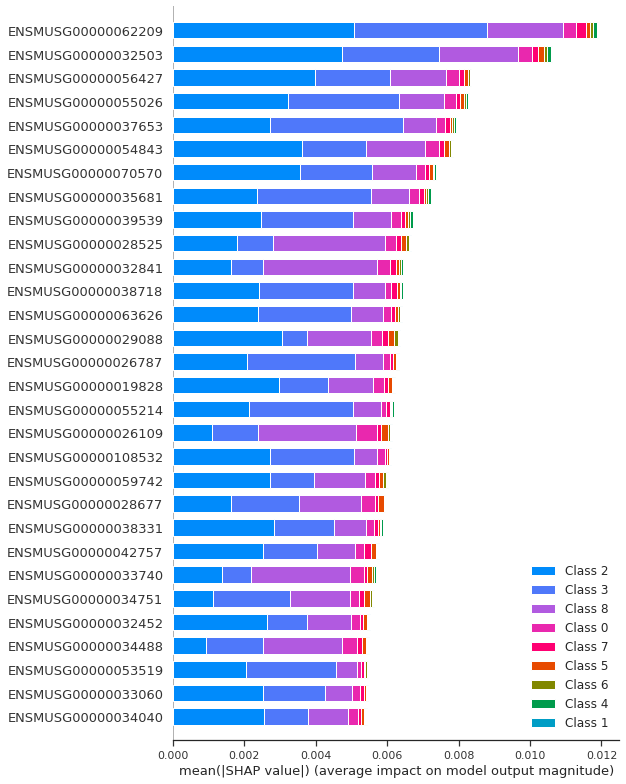

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or

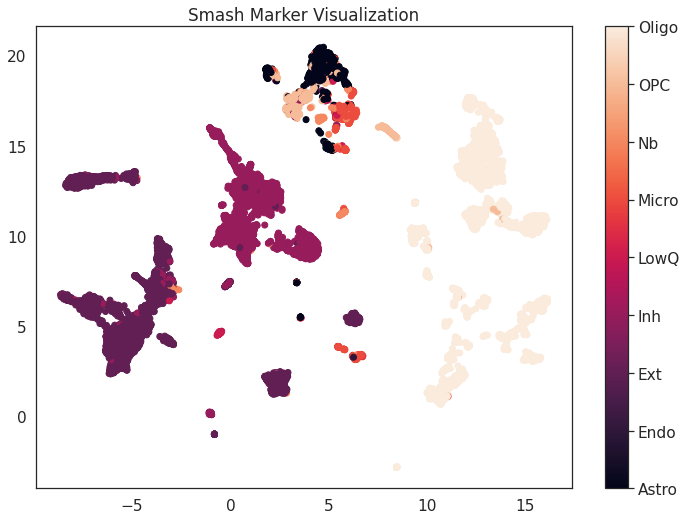

 * Initialising ...
Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_12 (Dense)             (None, 32)                146624    
_________________________________________________________________
batch_normalization_8 (Batch (None, 32)                128       
_________________________________________________________________
activation_8 (Activation)    (None, 32)                0         
_________________________________________________________________
dropout_8 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_13 (Dense)             (None, 16)                528       
_________________________________________________________________
batch_normalization_9 (Batch (None, 16)                64        
_________________________________________________________________
activation_9 (Activation)    (None

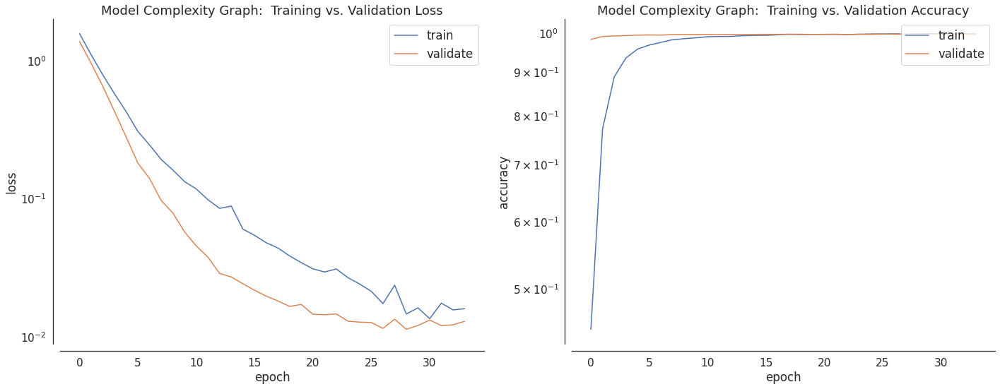

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning:

`model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).



<Figure size 432x288 with 0 Axes>

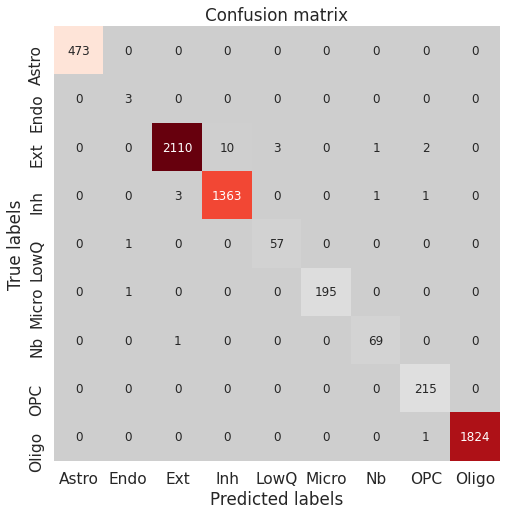

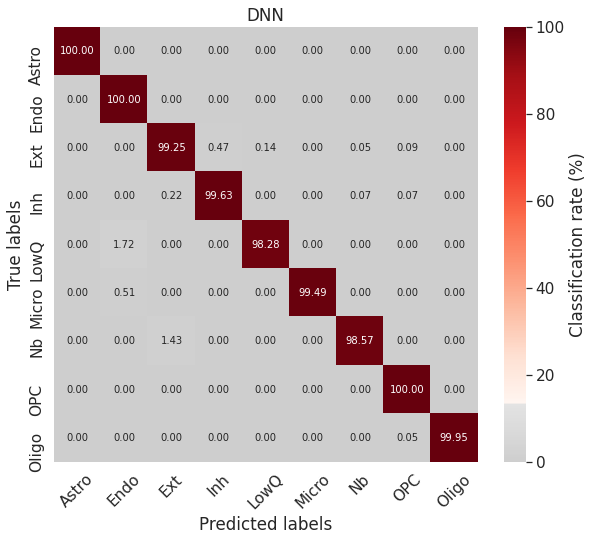

              precision    recall  f1-score   support

       Astro       1.00      1.00      1.00       473
        Endo       0.60      1.00      0.75         3
         Ext       1.00      0.99      1.00      2126
         Inh       0.99      1.00      0.99      1368
        LowQ       0.95      0.98      0.97        58
       Micro       1.00      0.99      1.00       196
          Nb       0.97      0.99      0.98        70
         OPC       0.98      1.00      0.99       215
       Oligo       1.00      1.00      1.00      1825

    accuracy                           1.00      6334
   macro avg       0.94      0.99      0.96      6334
weighted avg       1.00      1.00      1.00      6334

198/198 [==============================] - 1s 4ms/step - loss: 0.0113 - accuracy: 0.9968 - auc: 0.9998 - precision: 0.9970 - recall: 0.9968


/usr/local/lib/python3.7/dist-packages/shap/explainers/_deep/deep_tf.py:96: UserWarning:

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode. See PR #1483 for discussion.

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:434: UserWarning:

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.



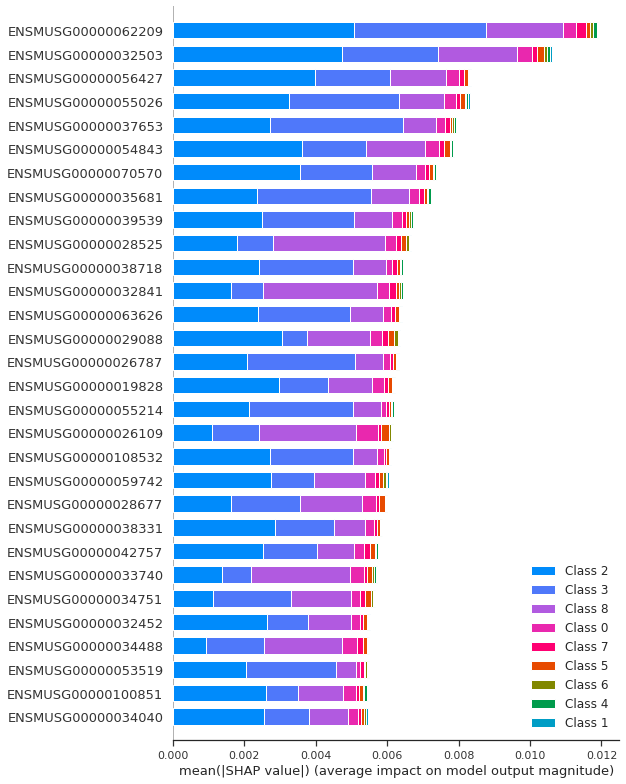

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or

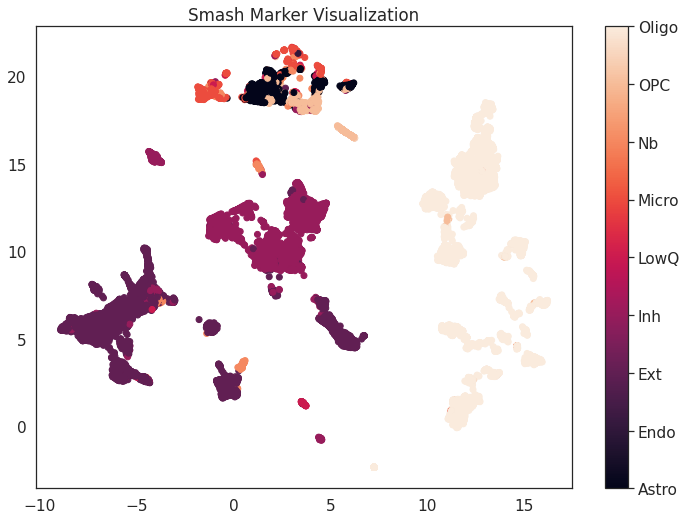

 * Initialising ...
Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_18 (Dense)             (None, 32)                146624    
_________________________________________________________________
batch_normalization_12 (Batc (None, 32)                128       
_________________________________________________________________
activation_12 (Activation)   (None, 32)                0         
_________________________________________________________________
dropout_12 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_19 (Dense)             (None, 16)                528       
_________________________________________________________________
batch_normalization_13 (Batc (None, 16)                64        
_________________________________________________________________
activation_13 (Activation)   (None

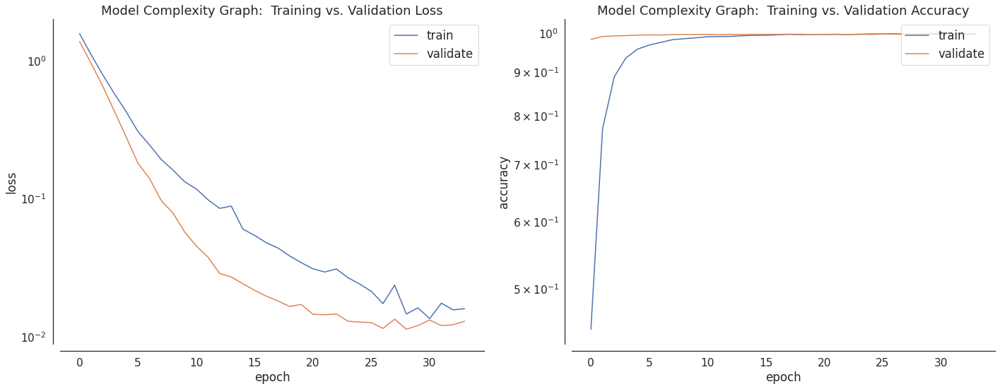

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning:

`model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).



<Figure size 432x288 with 0 Axes>

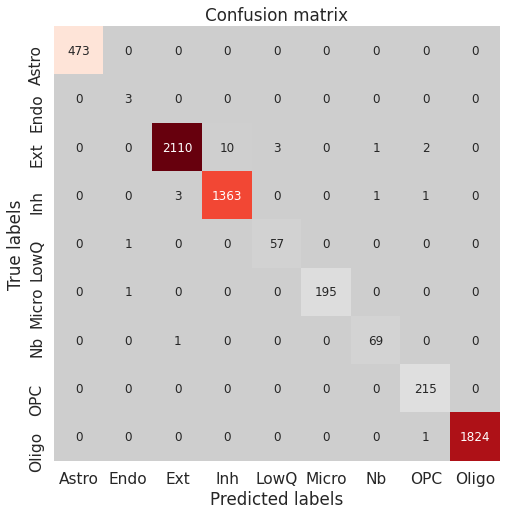

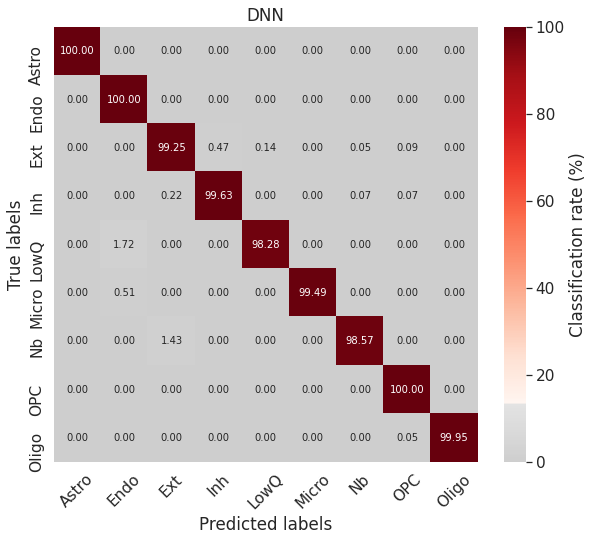

              precision    recall  f1-score   support

       Astro       1.00      1.00      1.00       473
        Endo       0.60      1.00      0.75         3
         Ext       1.00      0.99      1.00      2126
         Inh       0.99      1.00      0.99      1368
        LowQ       0.95      0.98      0.97        58
       Micro       1.00      0.99      1.00       196
          Nb       0.97      0.99      0.98        70
         OPC       0.98      1.00      0.99       215
       Oligo       1.00      1.00      1.00      1825

    accuracy                           1.00      6334
   macro avg       0.94      0.99      0.96      6334
weighted avg       1.00      1.00      1.00      6334

198/198 [==============================] - 1s 4ms/step - loss: 0.0113 - accuracy: 0.9968 - auc: 0.9998 - precision: 0.9970 - recall: 0.9968


/usr/local/lib/python3.7/dist-packages/shap/explainers/_deep/deep_tf.py:96: UserWarning:

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode. See PR #1483 for discussion.

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:434: UserWarning:

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.



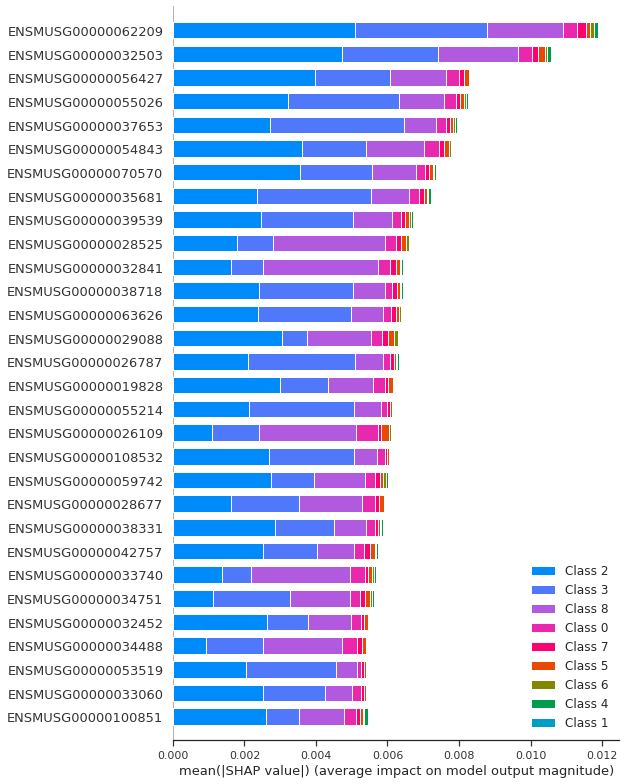

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or

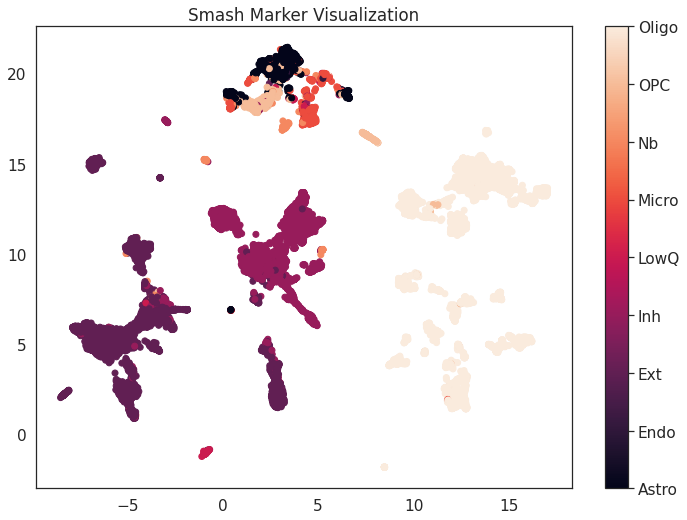

 * Initialising ...
Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_24 (Dense)             (None, 32)                146624    
_________________________________________________________________
batch_normalization_16 (Batc (None, 32)                128       
_________________________________________________________________
activation_16 (Activation)   (None, 32)                0         
_________________________________________________________________
dropout_16 (Dropout)         (None, 32)                0         
_________________________________________________________________
dense_25 (Dense)             (None, 16)                528       
_________________________________________________________________
batch_normalization_17 (Batc (None, 16)                64        
_________________________________________________________________
activation_17 (Activation)   (None

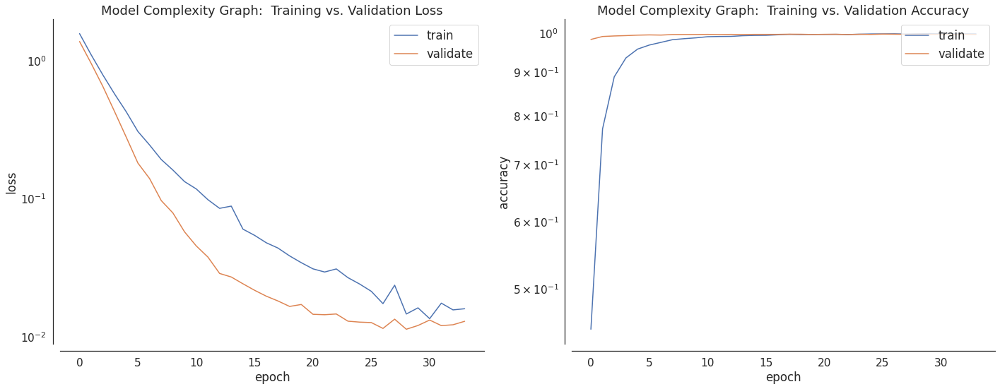

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/sequential.py:450: UserWarning:

`model.predict_classes()` is deprecated and will be removed after 2021-01-01. Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).



<Figure size 432x288 with 0 Axes>

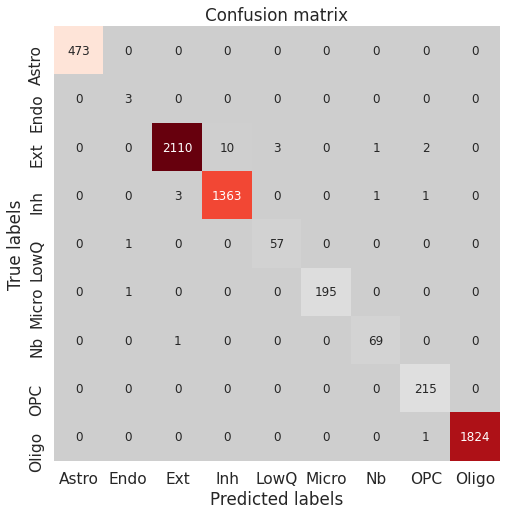

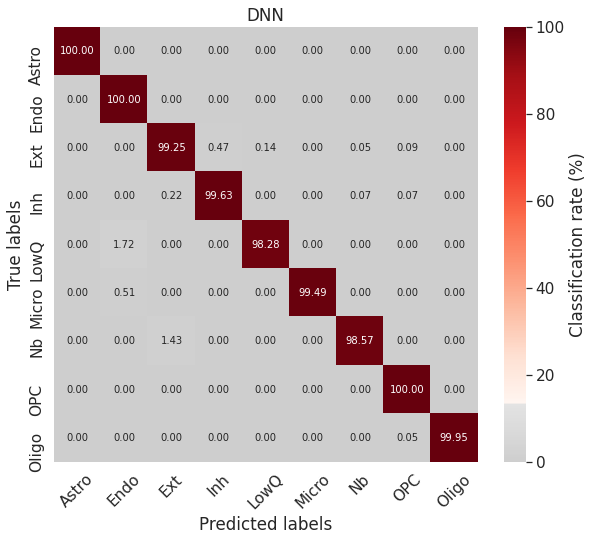

              precision    recall  f1-score   support

       Astro       1.00      1.00      1.00       473
        Endo       0.60      1.00      0.75         3
         Ext       1.00      0.99      1.00      2126
         Inh       0.99      1.00      0.99      1368
        LowQ       0.95      0.98      0.97        58
       Micro       1.00      0.99      1.00       196
          Nb       0.97      0.99      0.98        70
         OPC       0.98      1.00      0.99       215
       Oligo       1.00      1.00      1.00      1825

    accuracy                           1.00      6334
   macro avg       0.94      0.99      0.96      6334
weighted avg       1.00      1.00      1.00      6334

198/198 [==============================] - 1s 5ms/step - loss: 0.0113 - accuracy: 0.9968 - auc: 0.9998 - precision: 0.9970 - recall: 0.9968


/usr/local/lib/python3.7/dist-packages/shap/explainers/_deep/deep_tf.py:96: UserWarning:

Your TensorFlow version is newer than 2.4.0 and so graph support has been removed in eager mode. See PR #1483 for discussion.

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/backend.py:434: UserWarning:

`tf.keras.backend.set_learning_phase` is deprecated and will be removed after 2020-10-11. To update it, simply pass a True/False value to the `training` argument of the `__call__` method of your layer or model.



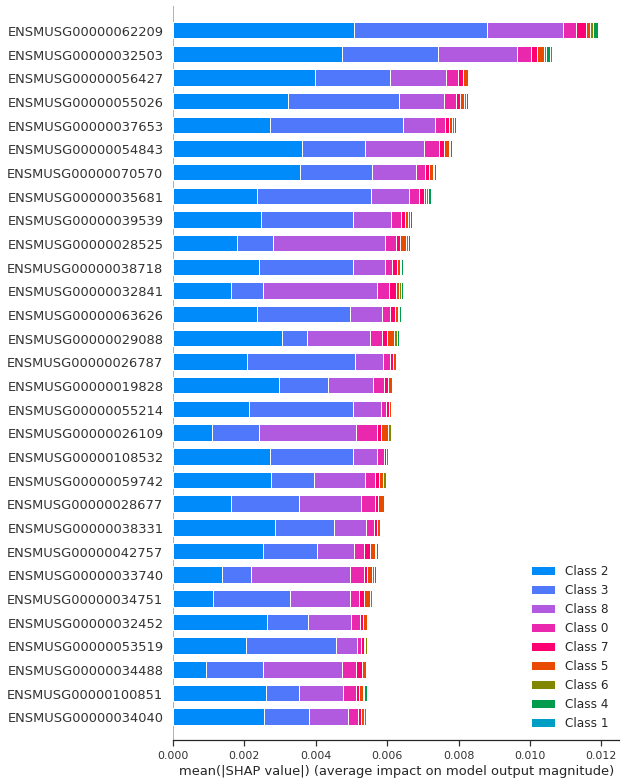

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or

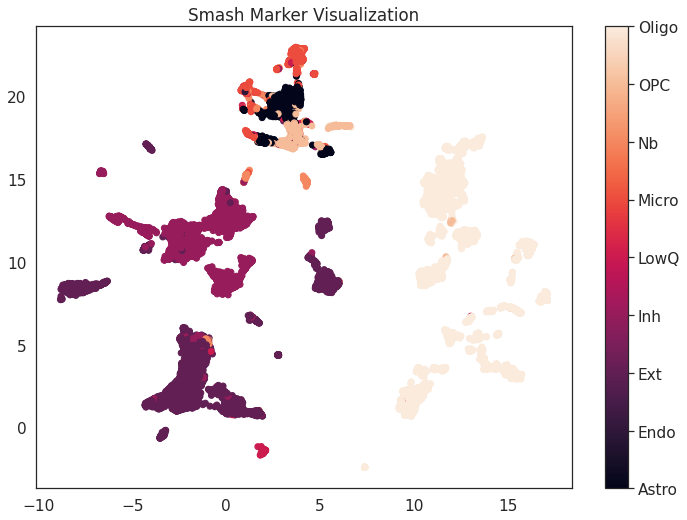

CPU times: user 1h 18min 37s, sys: 7min 38s, total: 1h 26min 15s
Wall time: 1h 14min 16s


In [ ]:
%%time
for tryy in range(1,num_times+1):
    _, _, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1)
    train_X_y = adata_snrna_raw[np.concatenate([train_indices, val_indices]), :]
    sm = smashpy.smashpy()
    sm.DNN(train_X_y, group_by="annotation", model=None, balance=True, verbose=True, save=False)
    selectedGenes, selectedGenes_dict = sm.run_shap(train_X_y, group_by="annotation", model=None, verbose=True, pct=0.1, restrict_top=("global", k))
    # since this selects k per class, need select randomly from each classes
    smash_markers = adata_snrna_raw.var.index.get_indexer(selectedGenes)

    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]
    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = smash_markers)
    np.save(model_save_path + 'smash_results_{}.npy'.format(tryy), results)
    np.save(model_save_path + 'smash_markers_{}.npy'.format(tryy), smash_markers)
    np.save(model_save_path + 'experiment_data_folds/smash_indices_{}.npy'.format(tryy), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'Smash Marker Visualization', path = viz_save_path + 'smash_markers_{}.png'.format(tryy), markers = smash_markers)

Names are different than in the example notebook but things like
ENSMUSG00000062209 correspond to Erbb4.

In [ ]:
results

(0.0146520146520146,
 {'0': {'f1-score': 0.9824293353705118,
   'precision': 0.9757207890743551,
   'recall': 0.9892307692307692,
   'support': 650},
  '1': {'f1-score': 0.0, 'precision': 0.0, 'recall': 0.0, 'support': 5},
  '2': {'f1-score': 0.9910846953937594,
   'precision': 0.987782302850796,
   'recall': 0.9944092433842714,
   'support': 2683},
  '3': {'f1-score': 0.9862595419847328,
   'precision': 0.982360097323601,
   'recall': 0.9901900674432863,
   'support': 1631},
  '4': {'f1-score': 0.7794117647058824,
   'precision': 1.0,
   'recall': 0.6385542168674698,
   'support': 83},
  '5': {'f1-score': 0.9346938775510204,
   'precision': 0.9015748031496063,
   'recall': 0.9703389830508474,
   'support': 236},
  '6': {'f1-score': 0.8142857142857143,
   'precision': 0.95,
   'recall': 0.7125,
   'support': 80},
  '7': {'f1-score': 0.9663865546218487,
   'precision': 0.9829059829059829,
   'recall': 0.9504132231404959,
   'support': 242},
  '8': {'f1-score': 0.9984845204589738,
   'pr

## Train RankCorr

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



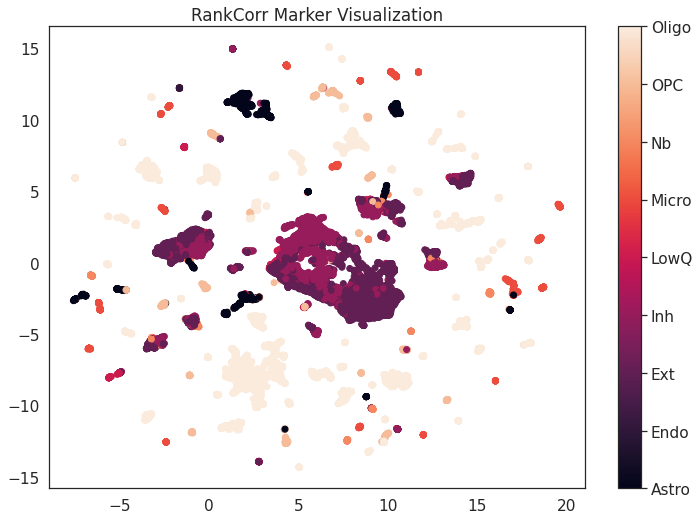

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



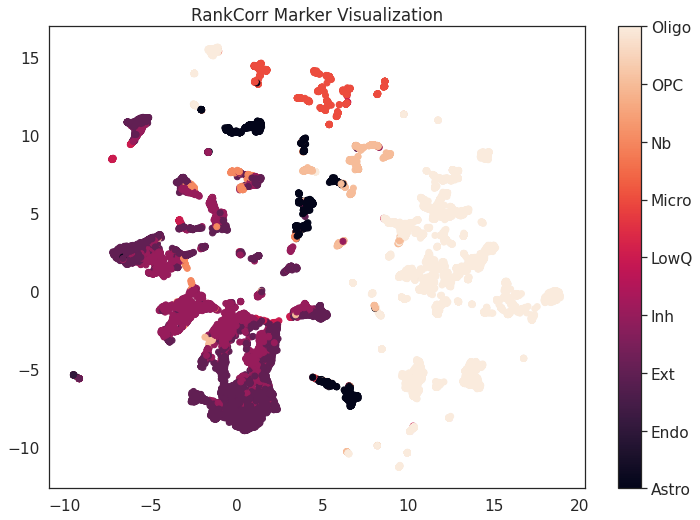

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



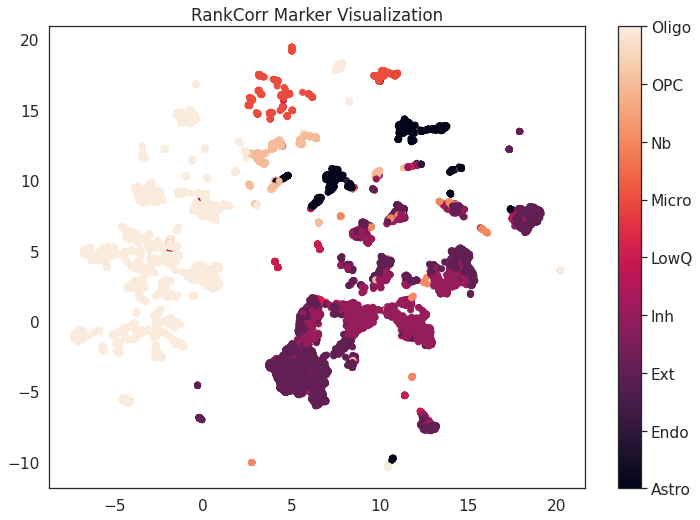

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



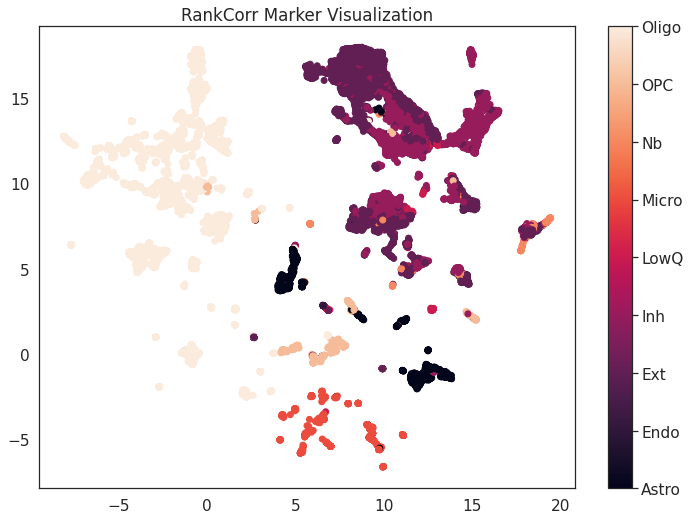

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



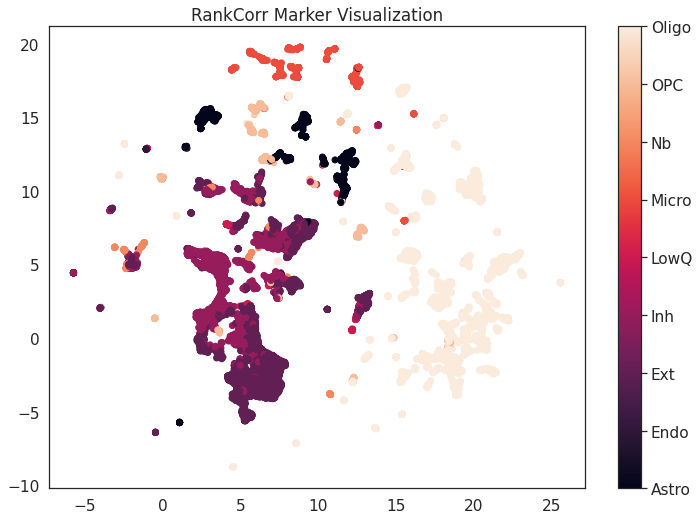

In [ ]:
for tryy in range(1,num_times+1):
    _, _, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1)
    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]

    data = Rocks(X_train, y_train)
    lamb =3.25# this can be whatever

    rankcorr_markers = data.CSrankMarkers(lamb=lamb, writeOut=False, keepZeros=False, onlyNonZero=False)
    if len(rankcorr_markers) > k:
        rankcorr_markers = rankcorr_markers[:k]
    geneNames = np.array(adata_snrna_raw.var.index)
    data.genes = geneNames
    marker_genes = data.markers_to_genes(rankcorr_markers)
    

    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = rankcorr_markers)
    np.save(model_save_path + 'rankcorr_results_{}.npy'.format(tryy), results)
    np.save(model_save_path + 'rankcorr_markers_{}.npy'.format(tryy), rankcorr_markers)
    np.save(model_save_path + 'experiment_data_folds/rankcorr_indices_{}.npy'.format(tryy), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'RankCorr Marker Visualization', path = viz_save_path + 'rankcorr_markers_{}.png'.format(tryy), markers = rankcorr_markers)

In [ ]:
results

(0.0304408235442718,
 {'0': {'f1-score': 0.9847972972972973,
   'precision': 0.9732888146911519,
   'recall': 0.9965811965811966,
   'support': 585},
  '1': {'f1-score': 0.5,
   'precision': 1.0,
   'recall': 0.3333333333333333,
   'support': 6},
  '2': {'f1-score': 0.9619678334910124,
   'precision': 0.9669075694180297,
   'recall': 0.9570783132530121,
   'support': 2656},
  '3': {'f1-score': 0.9413833528722156,
   'precision': 0.9293981481481481,
   'recall': 0.9536817102137767,
   'support': 1684},
  '4': {'f1-score': 0.8450704225352113,
   'precision': 0.9836065573770492,
   'recall': 0.7407407407407407,
   'support': 81},
  '5': {'f1-score': 0.9956331877729258,
   'precision': 0.9956331877729258,
   'recall': 0.9956331877729258,
   'support': 229},
  '6': {'f1-score': 0.8493150684931506,
   'precision': 0.9538461538461539,
   'recall': 0.7654320987654321,
   'support': 81},
  '7': {'f1-score': 0.9883720930232558,
   'precision': 0.9807692307692307,
   'recall': 0.99609375,
   'sup

## Train Running State

GPU available: True, used: True
TPU available: None, using: 0 TPU cores

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | enc_mean       | Linear     | 7.5 K 
2 | enc_logvar     | Linear     | 7.5 K 
3 | decoder        | Sequential | 2.3 M 
4 | dec_logvar     | Sequential | 2.3 M 
5 | weight_creator | Sequential | 5.1 M 
----------------------------------------------
12.5 M    Trainable params
0         Non-trainable params
12.5 M    Total params
50.029    Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:51: UserWarning:

The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilitie

Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | enc_mean       | Linear     | 7.5 K 
2 | enc_logvar     | Linear     | 7.5 K 
3 | decoder        | Sequential | 2.3 M 
4 | dec_logvar     | Sequential | 2.3 M 
5 | weight_creator | Sequential | 5.1 M 
----------------------------------------------
12.5 M    Trainable params
0         Non-trainable params
12.5 M    Total params
50.029    Total estimated model params size (MB)



New Learning Rate 9.100090000000001e-05


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



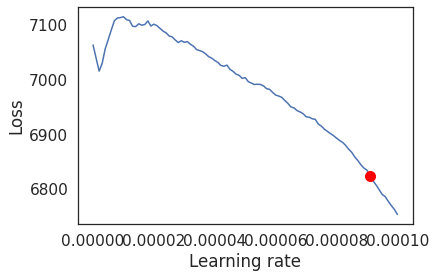

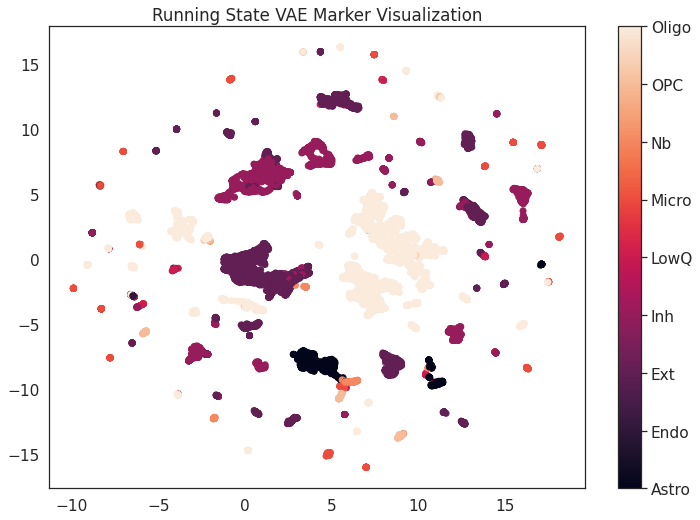

GPU available: True, used: True
TPU available: None, using: 0 TPU cores

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | enc_mean       | Linear     | 7.5 K 
2 | enc_logvar     | Linear     | 7.5 K 
3 | decoder        | Sequential | 2.3 M 
4 | dec_logvar     | Sequential | 2.3 M 
5 | weight_creator | Sequential | 5.1 M 
----------------------------------------------
12.5 M    Trainable params
0         Non-trainable params
12.5 M    Total params
50.029    Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:51: UserWarning:

The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilitie

Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | enc_mean       | Linear     | 7.5 K 
2 | enc_logvar     | Linear     | 7.5 K 
3 | decoder        | Sequential | 2.3 M 
4 | dec_logvar     | Sequential | 2.3 M 
5 | weight_creator | Sequential | 5.1 M 
----------------------------------------------
12.5 M    Trainable params
0         Non-trainable params
12.5 M    Total params
50.029    Total estimated model params size (MB)



New Learning Rate 9.40006e-05


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



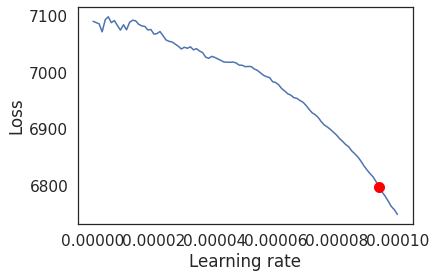

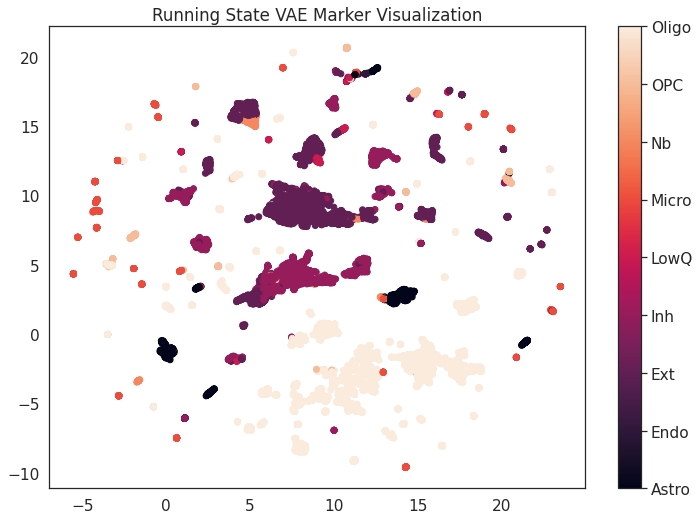

GPU available: True, used: True
TPU available: None, using: 0 TPU cores

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | enc_mean       | Linear     | 7.5 K 
2 | enc_logvar     | Linear     | 7.5 K 
3 | decoder        | Sequential | 2.3 M 
4 | dec_logvar     | Sequential | 2.3 M 
5 | weight_creator | Sequential | 5.1 M 
----------------------------------------------
12.5 M    Trainable params
0         Non-trainable params
12.5 M    Total params
50.029    Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:51: UserWarning:

The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilitie

Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | enc_mean       | Linear     | 7.5 K 
2 | enc_logvar     | Linear     | 7.5 K 
3 | decoder        | Sequential | 2.3 M 
4 | dec_logvar     | Sequential | 2.3 M 
5 | weight_creator | Sequential | 5.1 M 
----------------------------------------------
12.5 M    Trainable params
0         Non-trainable params
12.5 M    Total params
50.029    Total estimated model params size (MB)


New Learning Rate 1.3008700000000001e-05


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or

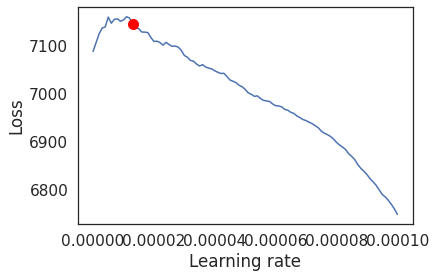

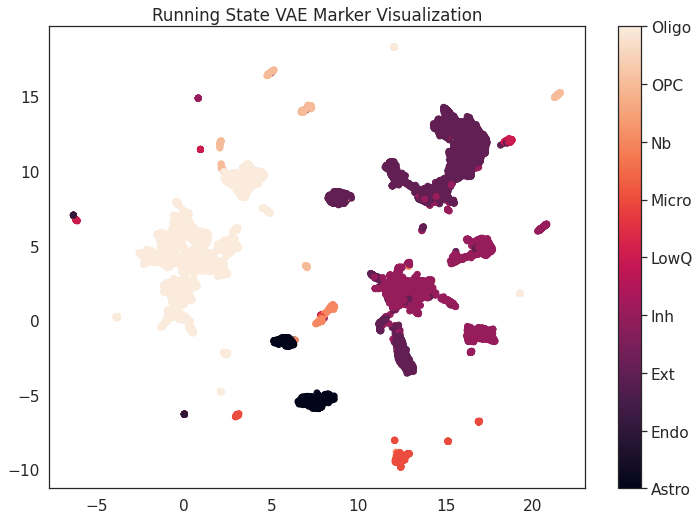

GPU available: True, used: True
TPU available: None, using: 0 TPU cores

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | enc_mean       | Linear     | 7.5 K 
2 | enc_logvar     | Linear     | 7.5 K 
3 | decoder        | Sequential | 2.3 M 
4 | dec_logvar     | Sequential | 2.3 M 
5 | weight_creator | Sequential | 5.1 M 
----------------------------------------------
12.5 M    Trainable params
0         Non-trainable params
12.5 M    Total params
50.029    Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:51: UserWarning:

The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilitie

Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | enc_mean       | Linear     | 7.5 K 
2 | enc_logvar     | Linear     | 7.5 K 
3 | decoder        | Sequential | 2.3 M 
4 | dec_logvar     | Sequential | 2.3 M 
5 | weight_creator | Sequential | 5.1 M 
----------------------------------------------
12.5 M    Trainable params
0         Non-trainable params
12.5 M    Total params
50.029    Total estimated model params size (MB)


New Learning Rate 9.80002e-05


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



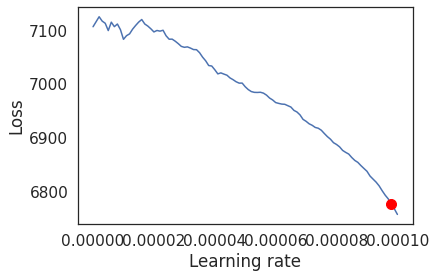

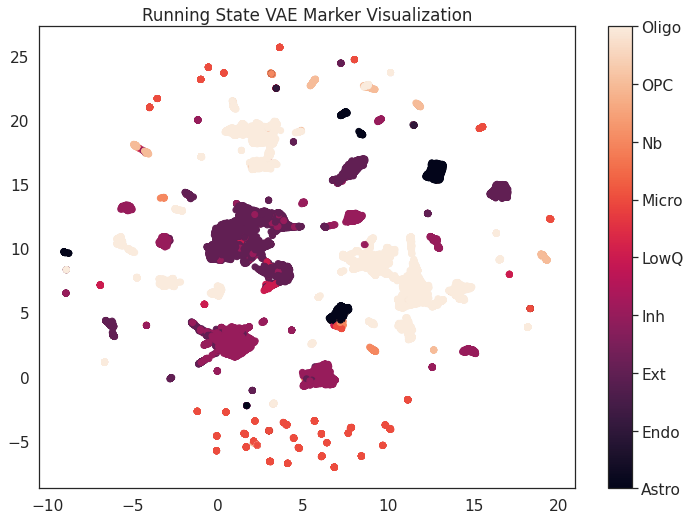

GPU available: True, used: True
TPU available: None, using: 0 TPU cores

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | enc_mean       | Linear     | 7.5 K 
2 | enc_logvar     | Linear     | 7.5 K 
3 | decoder        | Sequential | 2.3 M 
4 | dec_logvar     | Sequential | 2.3 M 
5 | weight_creator | Sequential | 5.1 M 
----------------------------------------------
12.5 M    Trainable params
0         Non-trainable params
12.5 M    Total params
50.029    Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:51: UserWarning:

The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilitie

Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | enc_mean       | Linear     | 7.5 K 
2 | enc_logvar     | Linear     | 7.5 K 
3 | decoder        | Sequential | 2.3 M 
4 | dec_logvar     | Sequential | 2.3 M 
5 | weight_creator | Sequential | 5.1 M 
----------------------------------------------
12.5 M    Trainable params
0         Non-trainable params
12.5 M    Total params
50.029    Total estimated model params size (MB)


New Learning Rate 9.90001e-05


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



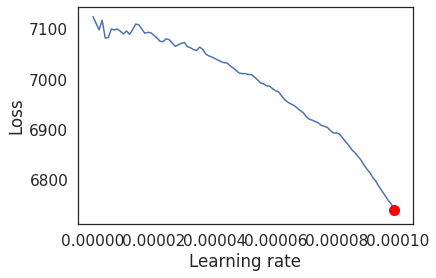

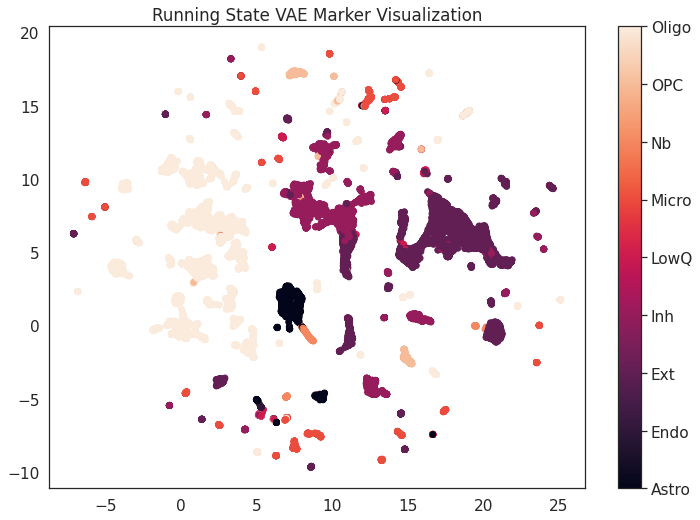

In [ ]:
for tryy in range(1,num_times+1):
    train_dataloader, val_dataloader, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1)
    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]

    model = VAE_Gumbel_RunningState(input_size, hidden_layer_size, z_size, k = k, t = global_t, bias = True, temperature_decay=0.95, alpha = 0.95)
    tmp_path = model_save_path + 'runningstate_vae_{}.ckpt'.format(tryy)
    train_save_model(model, train_dataloader, val_dataloader, tmp_path, gpus=1, min_epochs = 25, max_epochs = 800, auto_lr = True, max_lr = 0.0001, early_stopping_patience = 50, 
                     lr_explore_mode = 'linear', num_lr_rates = 500)
    runningstate_markers = model.markers().clone().cpu().detach().numpy()
    

    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = runningstate_markers)
    np.save(model_save_path + 'runningstate_vae_results_{}.npy'.format(tryy), results)
    np.save(model_save_path + 'runningstate_vae_markers_{}.npy'.format(tryy), runningstate_markers)
    np.save(model_save_path + 'experiment_data_folds/runningstate_vae_indices_{}.npy'.format(tryy), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'Running State VAE Marker Visualization', path = viz_save_path + 'runningstate_vae_markers_{}.png'.format(tryy), markers = runningstate_markers)

In [ ]:
results

(0.010483769104458807,
 {'0': {'f1-score': 0.9976019184652278,
   'precision': 0.9968051118210862,
   'recall': 0.9984,
   'support': 625},
  '1': {'f1-score': 0.6666666666666666,
   'precision': 1.0,
   'recall': 0.5,
   'support': 2},
  '2': {'f1-score': 0.9875994817693874,
   'precision': 0.9888806523350631,
   'recall': 0.9863216266173752,
   'support': 2705},
  '3': {'f1-score': 0.98558246828143,
   'precision': 0.9788087056128293,
   'recall': 0.9924506387921022,
   'support': 1722},
  '4': {'f1-score': 0.8859060402684563,
   'precision': 0.9850746268656716,
   'recall': 0.8048780487804879,
   'support': 82},
  '5': {'f1-score': 0.9880478087649402,
   'precision': 0.9763779527559056,
   'recall': 1.0,
   'support': 248},
  '6': {'f1-score': 0.9210526315789473,
   'precision': 0.9722222222222222,
   'recall': 0.875,
   'support': 80},
  '7': {'f1-score': 0.9891304347826086,
   'precision': 0.9963503649635036,
   'recall': 0.9820143884892086,
   'support': 278},
  '8': {'f1-score':

## Running State Classifier

GPU available: True, used: True
TPU available: None, using: 0 TPU cores

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | decoder        | Sequential | 13.5 K
2 | weight_creator | Sequential | 5.1 M 
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
7.9 M     Trainable params
0         Non-trainable params
7.9 M     Total params
31.621    Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:51: UserWarning:

The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:51: UserWarning:

The dataloader, train dataloader, does not have

Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | decoder        | Sequential | 13.5 K
2 | weight_creator | Sequential | 5.1 M 
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
7.9 M     Trainable params
0         Non-trainable params
7.9 M     Total params
31.621    Total estimated model params size (MB)


New Learning Rate 8.100190000000001e-05


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



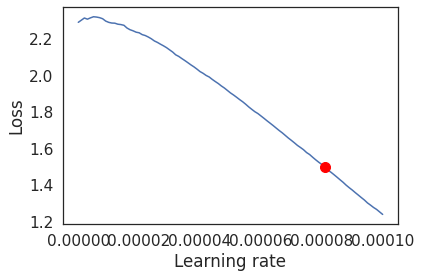

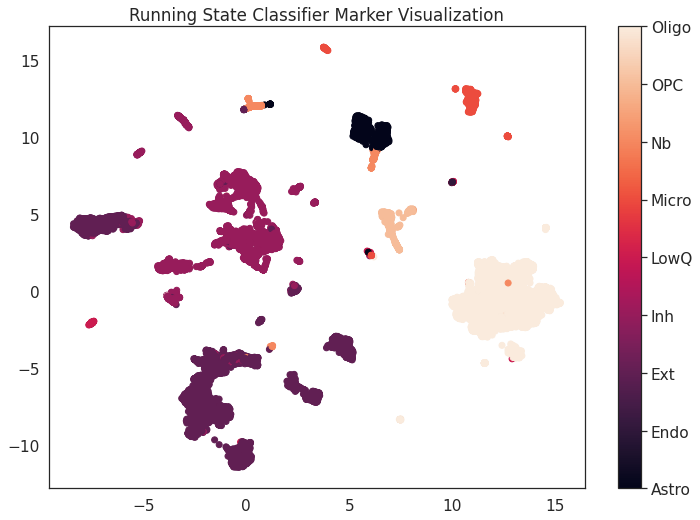

GPU available: True, used: True
TPU available: None, using: 0 TPU cores

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | decoder        | Sequential | 13.5 K
2 | weight_creator | Sequential | 5.1 M 
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
7.9 M     Trainable params
0         Non-trainable params
7.9 M     Total params
31.621    Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:51: UserWarning:

The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:51: UserWarning:

The dataloader, train dataloader, does not have

Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | decoder        | Sequential | 13.5 K
2 | weight_creator | Sequential | 5.1 M 
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
7.9 M     Trainable params
0         Non-trainable params
7.9 M     Total params
31.621    Total estimated model params size (MB)


New Learning Rate 7.600240000000001e-05


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



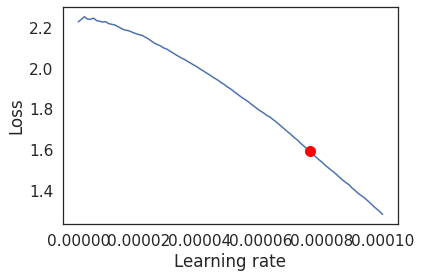

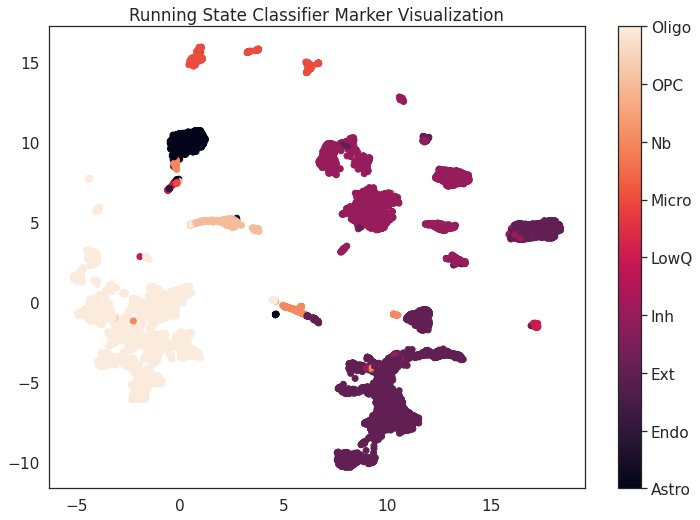

GPU available: True, used: True
TPU available: None, using: 0 TPU cores

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | decoder        | Sequential | 13.5 K
2 | weight_creator | Sequential | 5.1 M 
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
7.9 M     Trainable params
0         Non-trainable params
7.9 M     Total params
31.621    Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:51: UserWarning:

The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:51: UserWarning:

The dataloader, train dataloader, does not have

Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | decoder        | Sequential | 13.5 K
2 | weight_creator | Sequential | 5.1 M 
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
7.9 M     Trainable params
0         Non-trainable params
7.9 M     Total params
31.621    Total estimated model params size (MB)


New Learning Rate 2.7007300000000005e-05


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



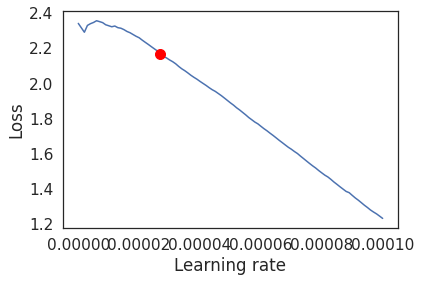

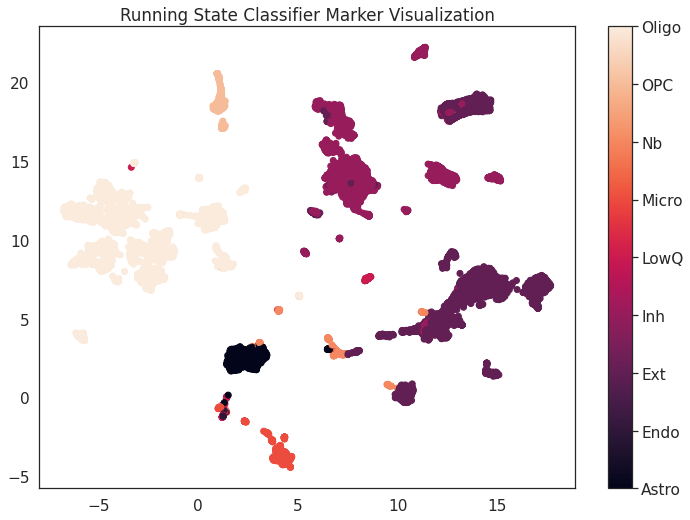

GPU available: True, used: True
TPU available: None, using: 0 TPU cores

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | decoder        | Sequential | 13.5 K
2 | weight_creator | Sequential | 5.1 M 
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
7.9 M     Trainable params
0         Non-trainable params
7.9 M     Total params
31.621    Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:51: UserWarning:

The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:51: UserWarning:

The dataloader, train dataloader, does not have

Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | decoder        | Sequential | 13.5 K
2 | weight_creator | Sequential | 5.1 M 
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
7.9 M     Trainable params
0         Non-trainable params
7.9 M     Total params
31.621    Total estimated model params size (MB)


New Learning Rate 8.30017e-05


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



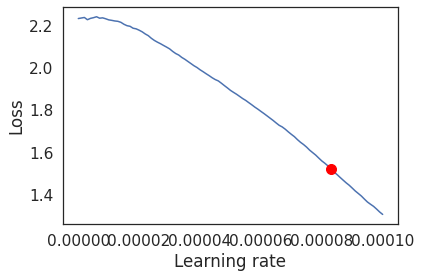

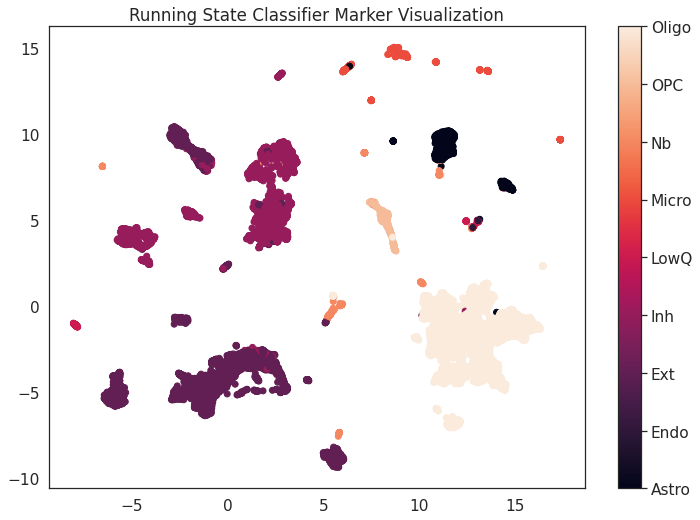

GPU available: True, used: True
TPU available: None, using: 0 TPU cores

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | decoder        | Sequential | 13.5 K
2 | weight_creator | Sequential | 5.1 M 
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
7.9 M     Trainable params
0         Non-trainable params
7.9 M     Total params
31.621    Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:51: UserWarning:

The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:51: UserWarning:

The dataloader, train dataloader, does not have

Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt

  | Name           | Type       | Params
----------------------------------------------
0 | encoder        | Sequential | 2.8 M 
1 | decoder        | Sequential | 13.5 K
2 | weight_creator | Sequential | 5.1 M 
3 | loss_function  | NLLLoss    | 0     
----------------------------------------------
7.9 M     Trainable params
0         Non-trainable params
7.9 M     Total params
31.621    Total estimated model params size (MB)


New Learning Rate 9.90001e-05


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray



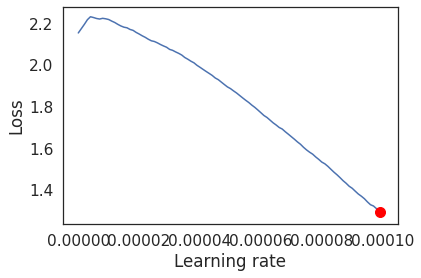

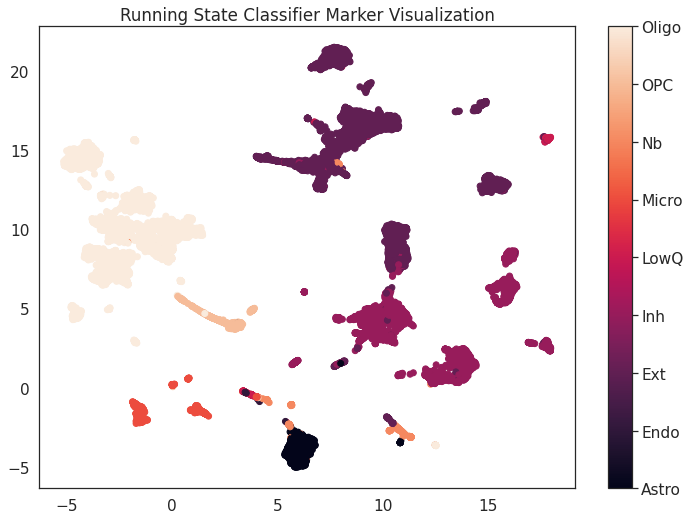

In [ ]:
for tryy in range(1,num_times+1):
    train_dataloader, val_dataloader, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1)
    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]

    model = GumbelClassifier(input_size, hidden_layer_size, z_size, num_classes = len(encoder.classes_), 
                             k = k, t = global_t, bias = True, temperature_decay=0.95, alpha = 0.95)
    tmp_path = model_save_path + 'runningstate_classifier_{}.ckpt'.format(tryy)
    train_save_model(model, train_dataloader, val_dataloader, tmp_path, gpus=1, min_epochs = 25, max_epochs = 800, auto_lr = True, max_lr = 0.0001, early_stopping_patience = 50, 
                     lr_explore_mode = 'linear', num_lr_rates = 500)
    runningstate_markers = model.markers().clone().cpu().detach().numpy()
    

    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = runningstate_markers)
    np.save(model_save_path + 'runningstate_classifier_results_{}.npy'.format(tryy), results)
    np.save(model_save_path + 'runningstate_classifier_markers_{}.npy'.format(tryy), runningstate_markers)
    np.save(model_save_path + 'experiment_data_folds/runningstate_classifier_indices_{}.npy'.format(tryy), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'Running State Classifier Marker Visualization', path = viz_save_path + 'runningstate_classifier_markers_{}.png'.format(tryy), markers = runningstate_markers)

In [ ]:
results

(0.005052418845522322,
 {'0': {'f1-score': 0.9974937343358397,
   'precision': 0.9983277591973244,
   'recall': 0.996661101836394,
   'support': 599},
  '1': {'f1-score': 0.5,
   'precision': 1.0,
   'recall': 0.3333333333333333,
   'support': 6},
  '2': {'f1-score': 0.9956775042285284,
   'precision': 0.994742771310552,
   'recall': 0.9966139954853274,
   'support': 2658},
  '3': {'f1-score': 0.9950335962605901,
   'precision': 0.9935822637106184,
   'recall': 0.9964891749561147,
   'support': 1709},
  '4': {'f1-score': 0.9064748201438849,
   'precision': 0.9692307692307692,
   'recall': 0.8513513513513513,
   'support': 74},
  '5': {'f1-score': 0.9900990099009901,
   'precision': 0.984251968503937,
   'recall': 0.9960159362549801,
   'support': 251},
  '6': {'f1-score': 0.9620253164556962,
   'precision': 0.9743589743589743,
   'recall': 0.95,
   'support': 80},
  '7': {'f1-score': 0.991869918699187,
   'precision': 0.9959183673469387,
   'recall': 0.9878542510121457,
   'support': 2

## Concrete VAE

GPU available: True, used: True
TPU available: None, using: 0 TPU cores

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 528 K 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
5.4 M     Trainable params
0         Non-trainable params
5.4 M     Total params
21.523    Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:51: UserWarning:

The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:51: UserWarning:

The dataloader, train dataloader, does

Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 528 K 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
5.4 M     Trainable params
0         Non-trainable params
5.4 M     Total params
21.523    Total estimated model params size (MB)



New Learning Rate 9.700030000000001e-05


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or

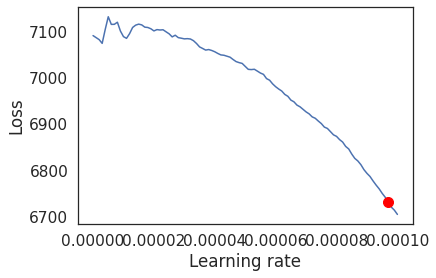

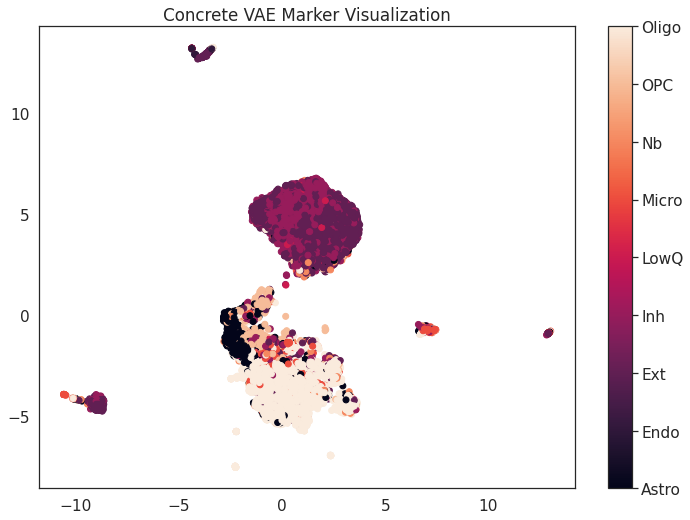

GPU available: True, used: True
TPU available: None, using: 0 TPU cores

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 528 K 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
5.4 M     Trainable params
0         Non-trainable params
5.4 M     Total params
21.523    Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:51: UserWarning:

The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:51: UserWarning:

The dataloader, train dataloader, does

Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 528 K 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
5.4 M     Trainable params
0         Non-trainable params
5.4 M     Total params
21.523    Total estimated model params size (MB)



New Learning Rate 9.90001e-05


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or

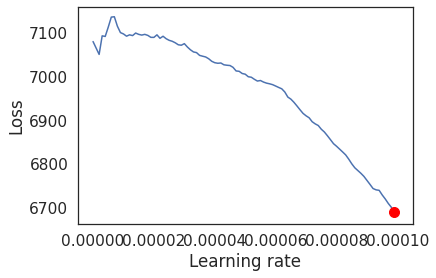

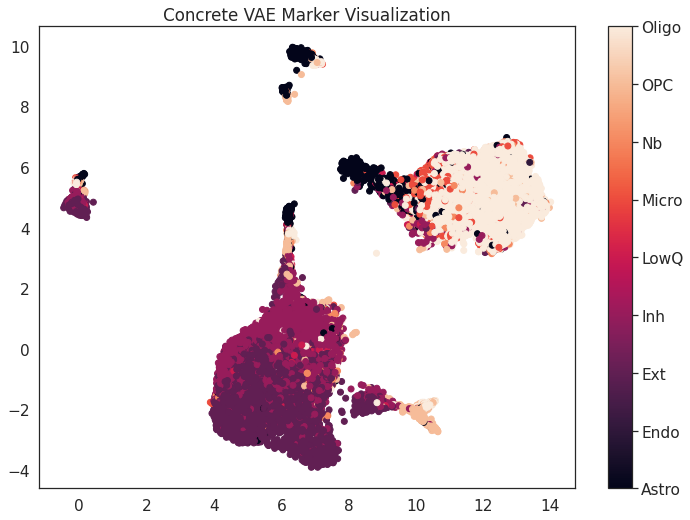

GPU available: True, used: True
TPU available: None, using: 0 TPU cores

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 528 K 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
5.4 M     Trainable params
0         Non-trainable params
5.4 M     Total params
21.523    Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:51: UserWarning:

The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:51: UserWarning:

The dataloader, train dataloader, does

Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 528 K 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
5.4 M     Trainable params
0         Non-trainable params
5.4 M     Total params
21.523    Total estimated model params size (MB)


New Learning Rate 9.700030000000001e-05


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or

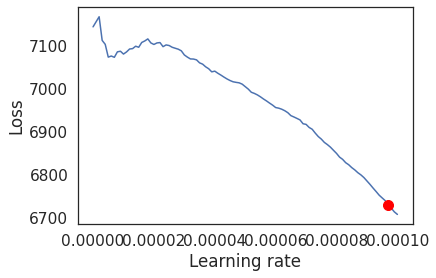

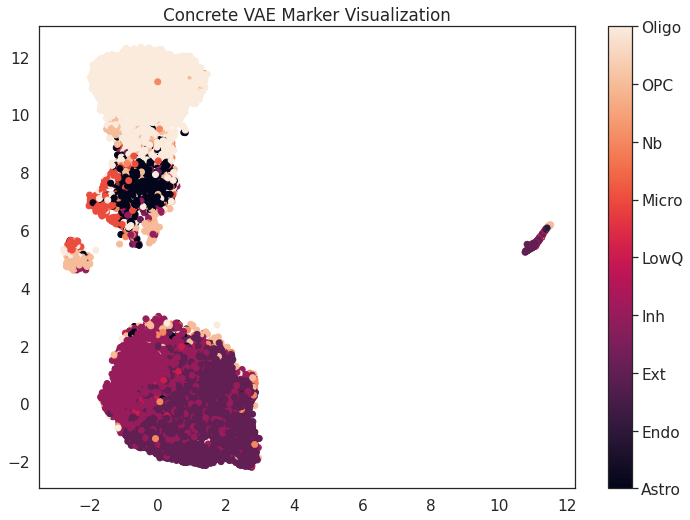

GPU available: True, used: True
TPU available: None, using: 0 TPU cores

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 528 K 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
5.4 M     Trainable params
0         Non-trainable params
5.4 M     Total params
21.523    Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:51: UserWarning:

The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:51: UserWarning:

The dataloader, train dataloader, does

Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 528 K 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
5.4 M     Trainable params
0         Non-trainable params
5.4 M     Total params
21.523    Total estimated model params size (MB)



New Learning Rate 9.20008e-05


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or

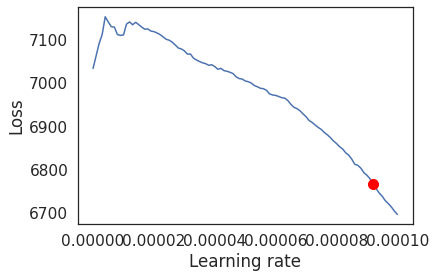

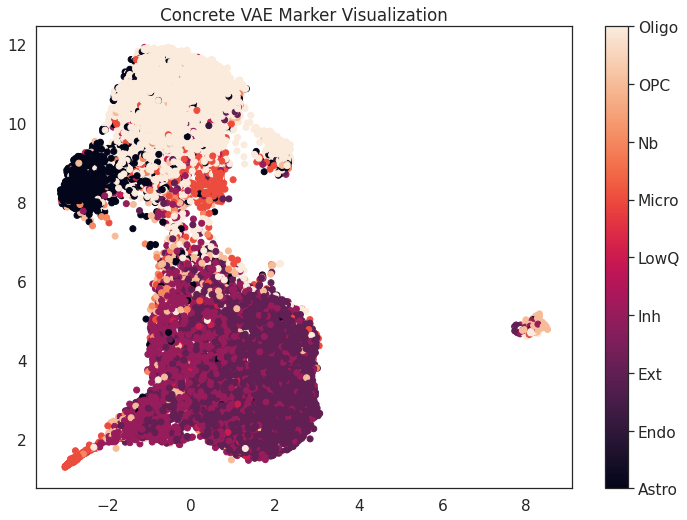

GPU available: True, used: True
TPU available: None, using: 0 TPU cores

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 528 K 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
5.4 M     Trainable params
0         Non-trainable params
5.4 M     Total params
21.523    Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:51: UserWarning:

The dataloader, val dataloader 0, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.

/usr/local/lib/python3.7/dist-packages/pytorch_lightning/utilities/distributed.py:51: UserWarning:

The dataloader, train dataloader, does

Restored states from the checkpoint file at /content/lr_find_temp_model.ckpt

  | Name       | Type       | Params
------------------------------------------
0 | encoder    | Sequential | 528 K 
1 | enc_mean   | Linear     | 7.5 K 
2 | enc_logvar | Linear     | 7.5 K 
3 | decoder    | Sequential | 2.3 M 
4 | dec_logvar | Sequential | 2.3 M 
------------------------------------------
5.4 M     Trainable params
0         Non-trainable params
5.4 M     Total params
21.523    Total estimated model params size (MB)


New Learning Rate 9.90001e-05


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or

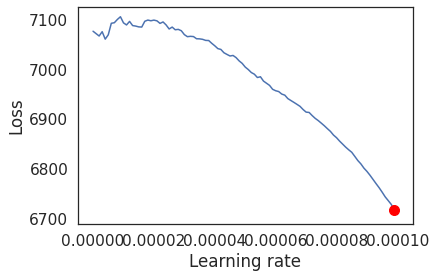

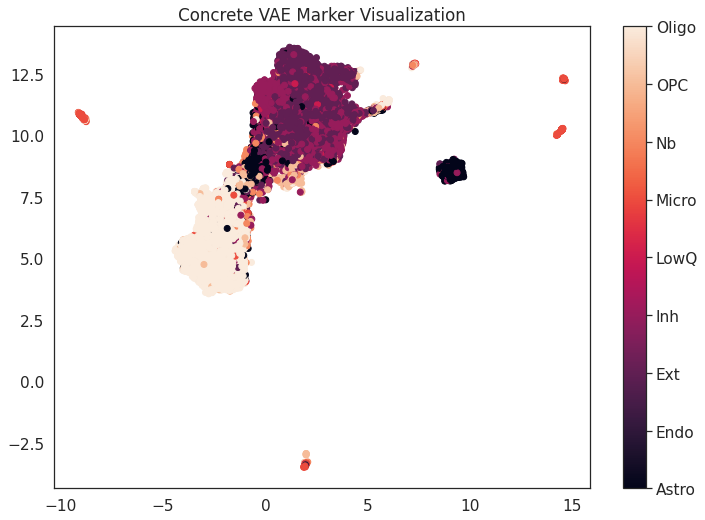

In [ ]:
for tryy in range(1,num_times+1):
    train_dataloader, val_dataloader, _, train_indices, val_indices, test_indices = split_data_into_dataloaders(X, y, 0.7, 0.1)
    X_train = X[np.concatenate([train_indices, val_indices]), :]
    y_train = y[np.concatenate([train_indices, val_indices])]
    X_test = X[test_indices,:]
    y_test = y[test_indices]

    model = ConcreteVAE_NMSL(input_size, hidden_layer_size, z_size, k = k, t = global_t, bias = True, temperature_decay = 0.95)
    tmp_path = model_save_path + 'concrete_vae_{}.ckpt'.format(tryy)
    train_save_model(model, train_dataloader, val_dataloader, tmp_path, gpus=1, min_epochs = 25, max_epochs = 800, auto_lr = True, max_lr = 0.0001, early_stopping_patience = 50, 
                     lr_explore_mode = 'linear', num_lr_rates = 500)
    concrete_vae_markers = model.markers().clone().cpu().detach().numpy()
    

    results = new_model_metrics(X_train, y_train, X_test, y_test, markers = concrete_vae_markers)
    np.save(model_save_path + 'concrete_vae_results_{}.npy'.format(tryy), results)
    np.save(model_save_path + 'concrete_vae_markers_{}.npy'.format(tryy), concrete_vae_markers)
    np.save(model_save_path + 'experiment_data_folds/concrete_vae_indices_{}.npy'.format(tryy), (train_indices, val_indices, test_indices))

    visualize_save_embedding(X, y, encoder, 'Concrete VAE Marker Visualization', path = viz_save_path + 'concrete_vae_markers_{}.png'.format(tryy), markers = concrete_vae_markers)

In [30]:
results = np.load(model_save_path + 'concrete_vae_results_{}.npy'.format(1), allow_pickle = True)

In [31]:
results

array([0.1135531135531136,
       {'0': {'precision': 0.9323181049069373, 'recall': 0.938671209540034, 'f1-score': 0.9354838709677419, 'support': 587}, '1': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 3}, '2': {'precision': 0.8672470076169749, 'recall': 0.8951703481842007, 'f1-score': 0.8809874723655121, 'support': 2671}, '3': {'precision': 0.8254994124559342, 'recall': 0.8254994124559342, 'f1-score': 0.8254994124559342, 'support': 1702}, '4': {'precision': 0.0, 'recall': 0.0, 'f1-score': 0.0, 'support': 77}, '5': {'precision': 0.8142292490118577, 'recall': 0.7463768115942029, 'f1-score': 0.77882797731569, 'support': 276}, '6': {'precision': 0.8333333333333334, 'recall': 0.23809523809523808, 'f1-score': 0.37037037037037035, 'support': 84}, '7': {'precision': 0.9012875536480687, 'recall': 0.8860759493670886, 'f1-score': 0.8936170212765958, 'support': 237}, '8': {'precision': 0.9498512537186571, 'recall': 0.9802631578947368, 'f1-score': 0.9648176127778977, 'support': 22

# Results and Visualizations

## Accuracies and F1

In [51]:
result_axis = [
 ('SMaSH DNN', 'smash_results_{}.npy'),
 ('RankCorr', 'rankcorr_results_{}.npy'),
 ('RunningGumbel VAE', 'runningstate_vae_results_{}.npy'),
 ('RunningGumbel Classifier', 'runningstate_classifier_results_{}.npy'),
 ('Concrete VAE',  'concrete_vae_results_{}.npy')
]

In [53]:
data_proto = []
indices = []
for axis in result_axis: 
    data_proto.append(model_variances(model_save_path + axis[1], num_times))
    indices.append(axis[0])

In [54]:
pd.DataFrame(data_proto, index = indices, 
             columns = ['Misclassification Mean', 'Weighted F1 Mean', 'Misclassification Standard Deviation', 'Weighted F1 Standard Deviation'])

,Misclassification Mean,Weighted F1 Mean,Misclassification Standard Deviation,Weighted F1 Standard Deviation
SMaSH DNN,0.014273,0.984802,0.000309,0.000302
RankCorr,0.030188,0.969460,0.001039,0.001016
RunningGumbel VAE,0.010484,0.989376,0.001734,0.001698
RunningGumbel Classifier,0.005558,0.994220,0.000639,0.000664
Concrete VAE,0.114336,0.877582,0.022527,0.023391


## Confusion Matrices

## UMap Visualization

In [55]:
import cv2

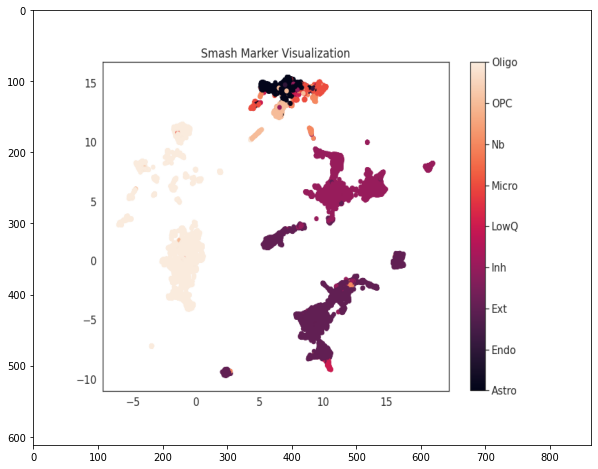

In [62]:
img = cv2.imread(viz_save_path + 'smash_markers_1.png')
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(img[:,:, ::-1], aspect = 'auto')
plt.show()

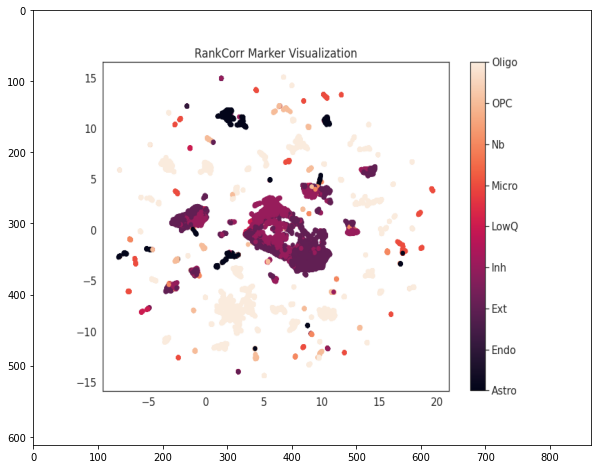

In [67]:
img = cv2.imread(viz_save_path + 'rankcorr_markers_1.png')
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(img[:,:, ::-1], aspect = 'auto')

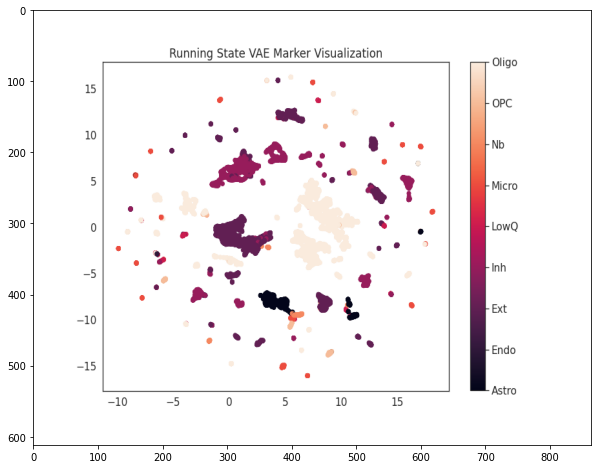

In [64]:
img = cv2.imread(viz_save_path + 'runningstate_vae_markers_1.png')
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(img[:,:, ::-1], aspect = 'auto')
plt.show()

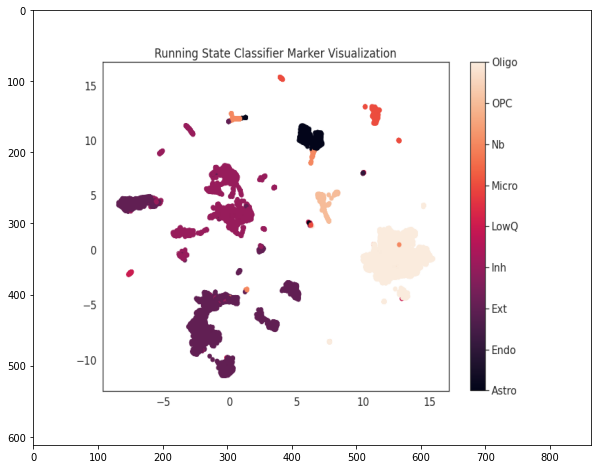

In [65]:
img = cv2.imread(viz_save_path + 'runningstate_classifier_markers_1.png')
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(img[:,:, ::-1], aspect = 'auto')
plt.show()

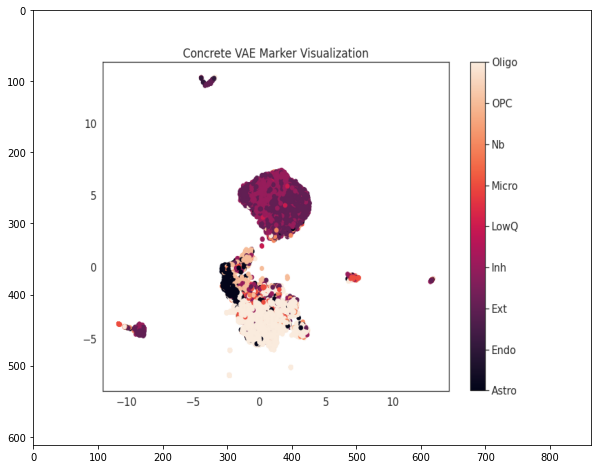

In [66]:
img = cv2.imread(viz_save_path + 'concrete_vae_markers_1.png')
fig, ax = plt.subplots(figsize=(10, 8))
ax.imshow(img[:,:, ::-1], aspect = 'auto')
plt.show()

# Things to note for paper

PySmash uses a seed internally so the model is deterministic to a particular dataset. We used various different train seeds, whereas the smash paper uses the whole dataset for the data.